When the matched filtering process is done, the data is first preconditionned in order to be used. Therefore, the frequencies are by passed. The aim of this notebook is to analyze how the frequencies used in order to filter the data are influencing the differet processes and steps of the analysis, such as the PSD, the matched filtering, the whitening, etc.

Once again, the first triple detection is used in order to see what are the variations in the different detectors due to the changes of these parameters. After that, it can eventually be looked at for other events in order to se if the results are the same.

First we look at the raw data, without any bandpassing for the frequencies

In [1]:
import sys
!{sys.executable} -m pip install --user pycbc lalsuite ligo-common --no-cache-dir

Looking in indexes: https://pypi.org/simple, https://packagecloud.io/cytomine-uliege/Cytomine-python-client/pypi/simple
You are using pip version 10.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
import matplotlib
import matplotlib.pyplot as plt
matplotlib.__version__

'2.2.5'

Text(0.5,1,'Virgo raw data')

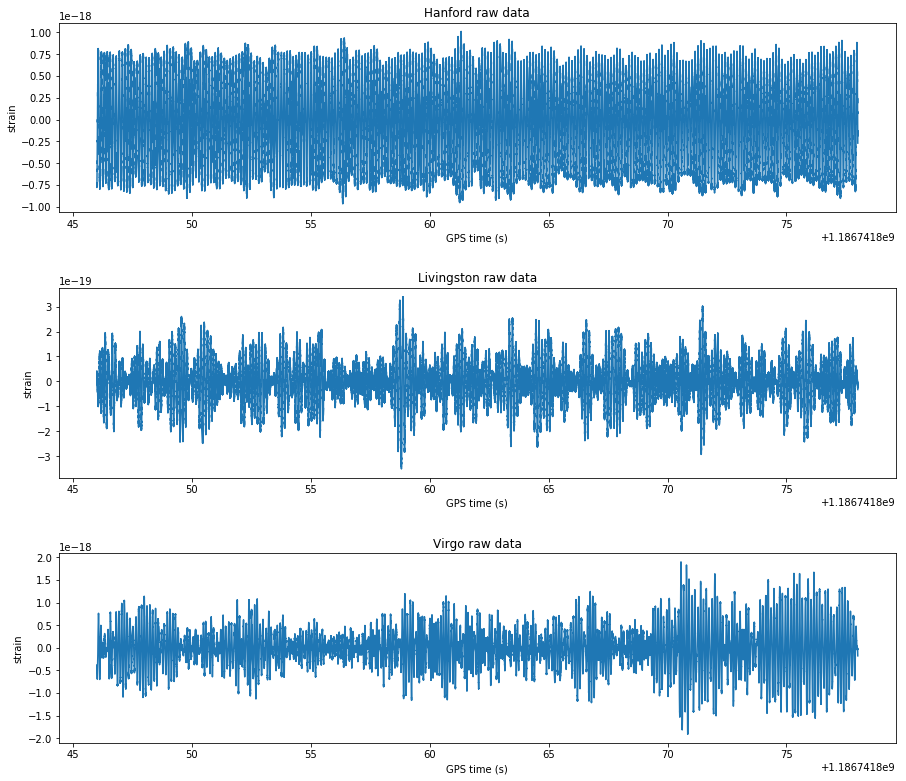

In [3]:
%matplotlib inline
from pycbc.catalog import Merger
import matplotlib.pyplot as plt
m= Merger("GW170814")
ts_han=m.strain('H1')
ts_liv=m.strain('L1')
ts_vir=m.strain('V1')
f=plt.figure(figsize=[15,5])
ax=f.subplots(nrows=3)
f.subplots_adjust(bottom=18, top=20, wspace= 0.4, hspace=0.4)
ax[0].plot(ts_han.sample_times, ts_han, label='H1')
ax[1].plot(ts_liv.sample_times, ts_liv, label='L1')
ax[2].plot(ts_vir.sample_times, ts_vir, label='V1')
for i in range(3):
        ax[i].set_xlabel('GPS time (s)')
        ax[i].set_ylabel('strain')
ax[0].set_title("Hanford raw data")
ax[1].set_title('Livingston raw data')
ax[2].set_title("Virgo raw data")

First, we compare the Hanford data before and after the bandpassing for the frequency of 15Hz
The .highpass_fir() functions takes as first arguments the lowest frequency that one lets pass (ie 15Hz for the example) and the second argument corresponds to half the sample lenght of the highpass filter. Normally, the goal of this manipulation is to reduce the low frequency noises that are due to the instruments and bring all the signal in the range corresponding to the frequencies for a gravitatinal wave event.

Text(0,0.5,'strain')

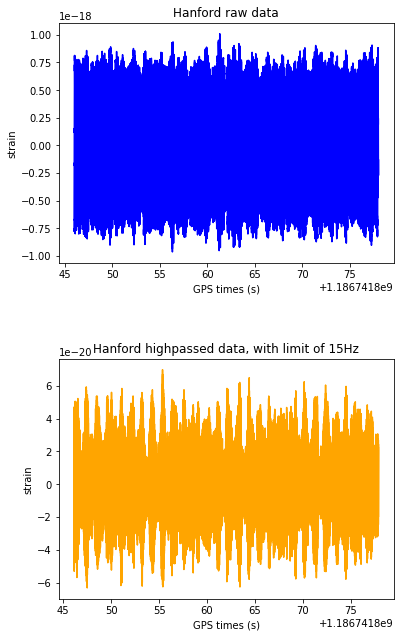

In [4]:
ts_han_high=ts_han.highpass_fir(15,512)
f=plt.figure()
ax=f.subplots(nrows=2)
f.subplots_adjust(bottom=18, top=20, wspace= 0.4, hspace=0.4)
ax[0].plot(ts_han.sample_times, ts_han, color='blue')
ax[0].set_title("Hanford raw data")
ax[0].set_xlabel("GPS times (s)")
ax[0].set_ylabel("strain")
ax[1].plot(ts_han_high.sample_times, ts_han_high, color='orange')
ax[1].set_title("Hanford highpassed data, with limit of 15Hz")
ax[1].set_xlabel("GPS times (s)")
ax[1].set_ylabel("strain")

/home/justin/.local/lib/python2.7/site-packages/matplotlib/legend.py:651: UserWarning: Automatic legend placement (loc="best") not implemented for figure legend. Falling back on "upper right".
  warnings.warn('Automatic legend placement (loc="best") not '


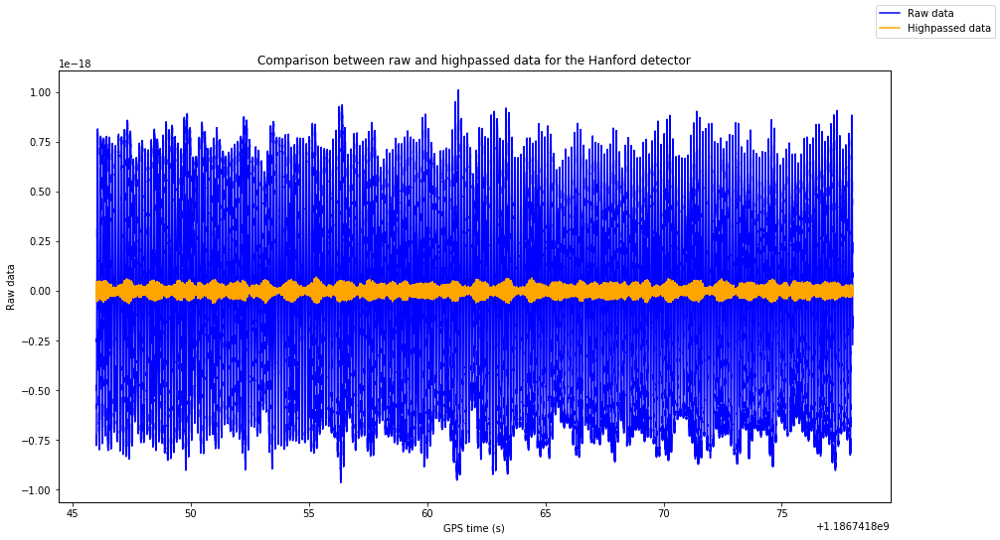

In [5]:
#if we plot on the same figure, it is possible to see that the range of the highpassed case is smaller
f=plt.figure(figsize=(15,8))
ax1=f.add_subplot(1,1,1)
ax2=ax1.twiny()
ax1.plot(ts_han.sample_times, ts_han,label="Raw data", color='blue')
ax1.set_ylabel("Raw data")
ax2.set_ylabel("Highpassed data")
ax2.plot(ts_han_high.sample_times, ts_han_high,label="Highpassed data" ,color='orange')
ax1.set_title("Comparison between raw and highpassed data for the Hanford detector")
ax1.set_xlabel("GPS time (s)")
ax2.set_xticks([])
f.legend(loc='best')


There is thus a clear removal of the noise. Before pursuing, we see if the difference is as important in the case of the two other detectors

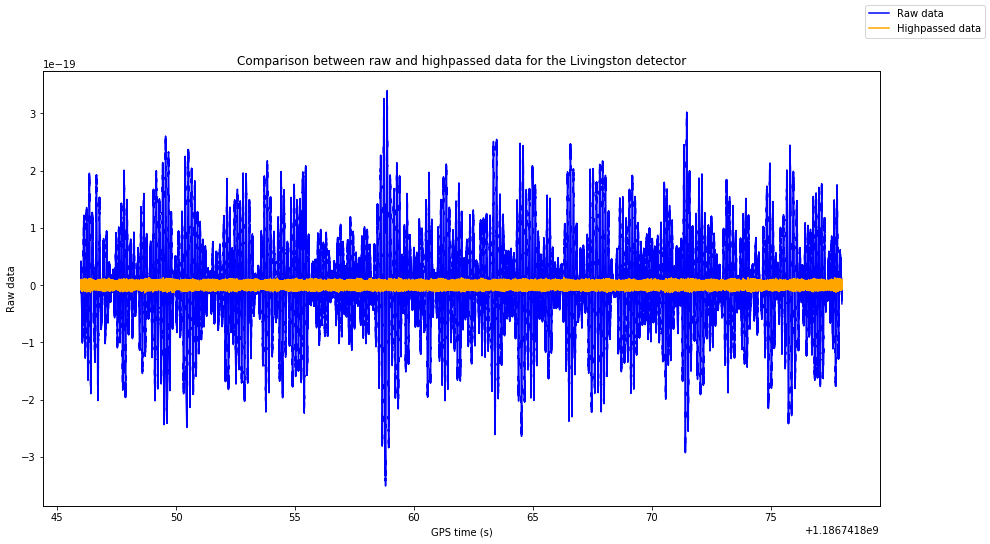

In [6]:
#for Livingtson
ts_liv_high=ts_liv.highpass_fir(15,512)
f=plt.figure(figsize=(15,8))
ax1=f.add_subplot(1,1,1)
ax2=ax1.twiny()
ax1.plot(ts_liv.sample_times, ts_liv, label="Raw data", color='blue')
ax1.set_ylabel("Raw data")
ax2.set_ylabel("Highpassed data")
ax2.plot(ts_liv_high.sample_times, ts_liv_high,label="Highpassed data" ,color='orange')
ax1.set_title("Comparison between raw and highpassed data for the Livingston detector")
ax1.set_xlabel("GPS time (s)")
ax2.set_xticks([])
f.legend(loc='best')

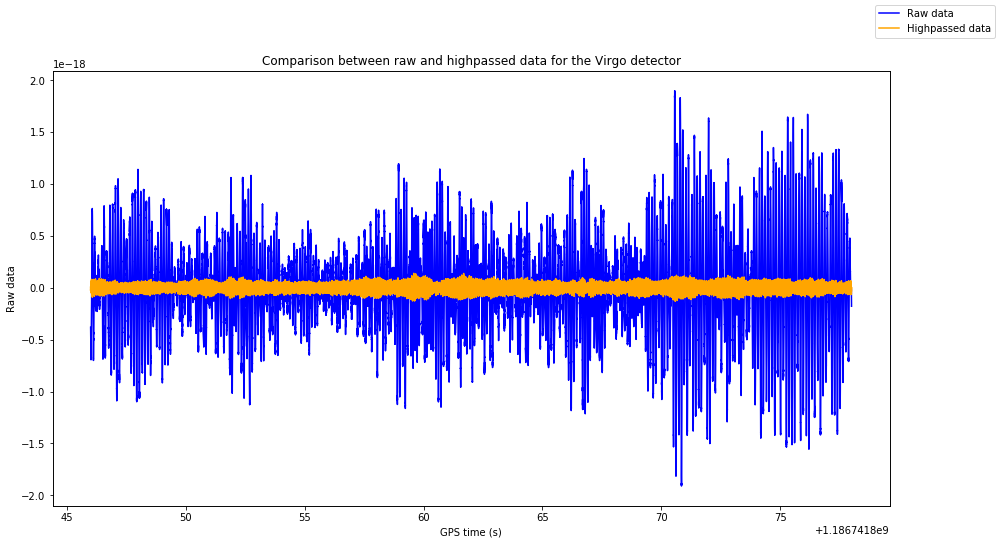

In [7]:
#Virgo detector
ts_vir_high=ts_vir.highpass_fir(15,512)
f=plt.figure(figsize=(15,8))
ax1=f.add_subplot(1,1,1)
ax2=ax1.twiny()
ax1.plot(ts_vir.sample_times, ts_vir, label="Raw data", color='blue')
ax1.set_ylabel("Raw data")
ax2.set_ylabel("Highpassed data")
ax2.plot(ts_vir_high.sample_times, ts_vir_high,label="Highpassed data" ,color='orange')
ax1.set_title("Comparison between raw and highpassed data for the Virgo detector")
ax1.set_xlabel("GPS time (s)")
ax2.set_xticks([])
f.legend(loc='best')

The data is clearly modified and the lowest frequencies are removed. This can indeed been seen because the long term variations (which are the modulation in amplitudes over the longer cycles are removed from the figure). The small variations, on short time scales remain. This is shiwn by zooming on the plot, as is done below.

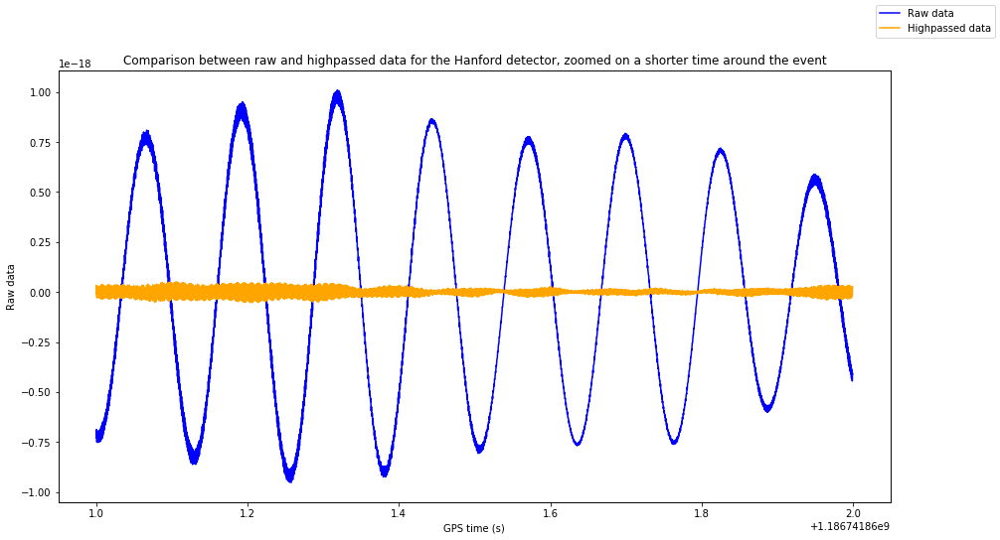

In [8]:
#zoom for Hanford
han_zoom=ts_han.time_slice(m.time-0.5, m.time+0.5)
han_high_zoom=ts_han_high.time_slice(m.time-0.5, m.time+0.5)
f=plt.figure(figsize=(15,8))
ax1=f.add_subplot(1,1,1)
ax2=ax1.twiny()
ax1.plot(han_zoom.sample_times, han_zoom, label="Raw data", color='blue')
ax1.set_ylabel("Raw data")
ax2.set_ylabel("Highpassed data")
ax2.plot(han_high_zoom.sample_times, han_high_zoom,label="Highpassed data" ,color='orange')
ax1.set_title("Comparison between raw and highpassed data for the Hanford detector, zoomed on a shorter time around the event")
ax1.set_xlabel("GPS time (s)")
ax2.set_xticks([])
f.legend(loc='best')

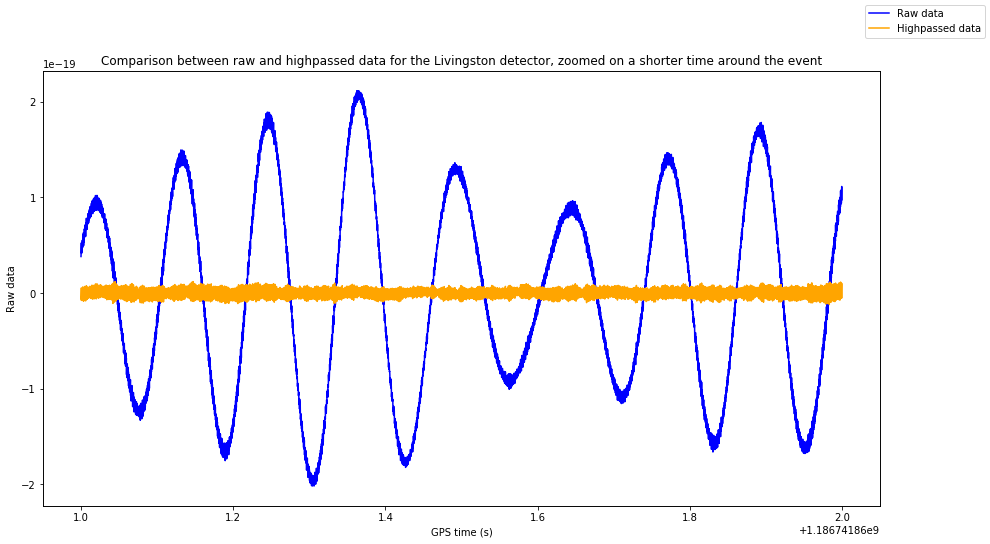

In [9]:
#zoom for Livingston
liv_zoom=ts_liv.time_slice(m.time-0.5, m.time+0.5)
liv_high_zoom=ts_liv_high.time_slice(m.time-0.5, m.time+0.5)
f=plt.figure(figsize=(15,8))
ax1=f.add_subplot(1,1,1)
ax2=ax1.twiny()
ax1.plot(liv_zoom.sample_times, liv_zoom, label="Raw data", color='blue')
ax1.set_ylabel("Raw data")
ax2.set_ylabel("Highpassed data")
ax2.plot(liv_high_zoom.sample_times, liv_high_zoom,label="Highpassed data" ,color='orange')
ax1.set_title("Comparison between raw and highpassed data for the Livingston detector, zoomed on a shorter time around the event")
ax1.set_xlabel("GPS time (s)")
ax2.set_xticks([])
f.legend(loc='best')

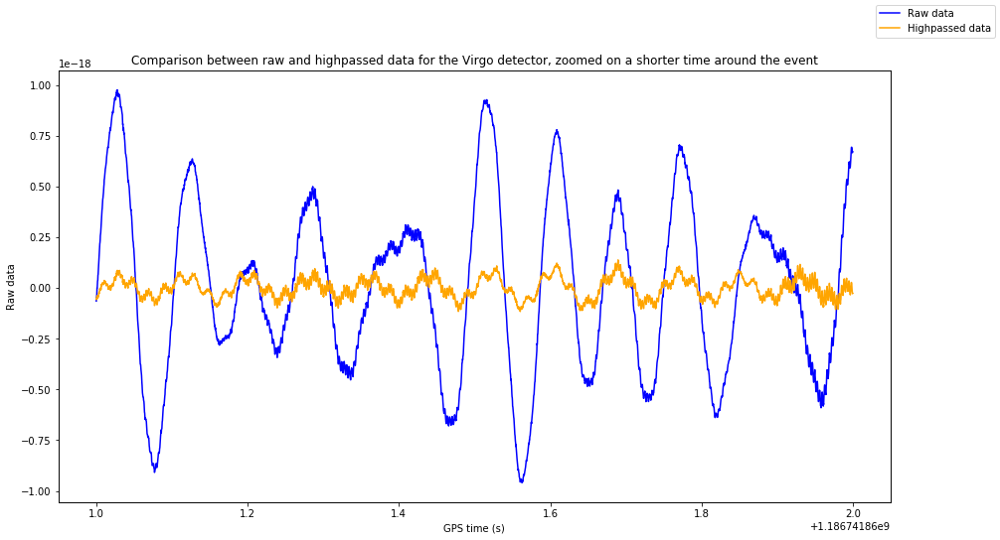

In [10]:
#zoom for Virgpo
vir_zoom=ts_vir.time_slice(m.time-0.5, m.time+0.5)
vir_high_zoom=ts_vir_high.time_slice(m.time-0.5, m.time+0.5)
f=plt.figure(figsize=(15,8))
ax1=f.add_subplot(1,1,1)
ax2=ax1.twiny()
ax1.plot(vir_zoom.sample_times, vir_zoom, label="Raw data", color='blue')
ax1.set_ylabel("Raw data")
ax2.set_ylabel("Highpassed data")
ax2.plot(vir_high_zoom.sample_times, vir_high_zoom,label="Highpassed data" ,color='orange')
ax1.set_title("Comparison between raw and highpassed data for the Virgo detector, zoomed on a shorter time around the event")
ax1.set_xlabel("GPS time (s)")
ax2.set_xticks([])
f.legend(loc='best')

If the goal of this highpass is to reduce the noise due to the instruments, it is important to choose the cutoff frequency in such as way that it enables to reduce effectively the noise but also in order to be sure that the GW signal is not taken out of the signal. 

# Test of the influence on the frequency used in order to do the high pass and low pass 

In the analysis, the frequency are cut off in order to have a better view on the signal. Here, the goal is to see how the analysis is influenced by the eventual cut off for the different frequencies


In [11]:
%matplotlib inline 

#first we need to set bigger characters for the titles, labels and thicks.
import matplotlib
import matplotlib.pyplot as plt
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 12}

matplotlib.rc('font', **font)

Text(0.5,1,'Raw data in the L1 detector for the GW170814 event')

/home/justin/.local/lib/python2.7/site-packages/matplotlib/font_manager.py:1333: UserWarning: findfont: Font family [u'normal'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


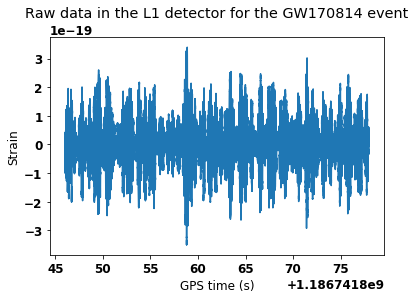

In [12]:
from pycbc.catalog import Merger
m= Merger("GW170814")
data=m.strain('L1')
plt.plot(data.sample_times, data)
plt.xlabel("GPS time (s)")
plt.ylabel("Strain")
plt.title("Raw data in the L1 detector for the GW170814 event", pad=20)

Text(0.5,1,'Raw data in the L1 detector for the GW170814 event')

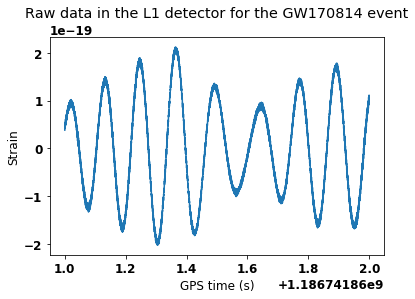

In [13]:
#zoomed version of the plot
zoom=data.time_slice(m.time-0.5, m.time+0.5)
plt.plot(zoom.sample_times, zoom)
plt.xlabel("GPS time (s)")
plt.ylabel("Strain")
plt.title("Raw data in the L1 detector for the GW170814 event", pad=20)

## Cut off the lowest frequencies

Normally, the highpass frequency is used in order to cut off the low frequencies which are due to instrumental noise. However, if we increase the frequency that is cutoff, it is possible to cut off a part of the GW signal. So, it could disapear out of the signature, which can be seen here by looking at the Q transform.

Note that, in the basic analysis of the event, the frequency cut off was set at 15Hz. We will try here from 5 Hz to 50Hz, noting that the range of the GW should be of the order of 30 to 500 Hz. 

THhe function used here is data.highpass_fir(cut_off, half_sample_lenght). The half sample length is fixed here at 512Hz, which correspond to the one used in the analysis donc previously. Normally, a higher value should give less ripples.

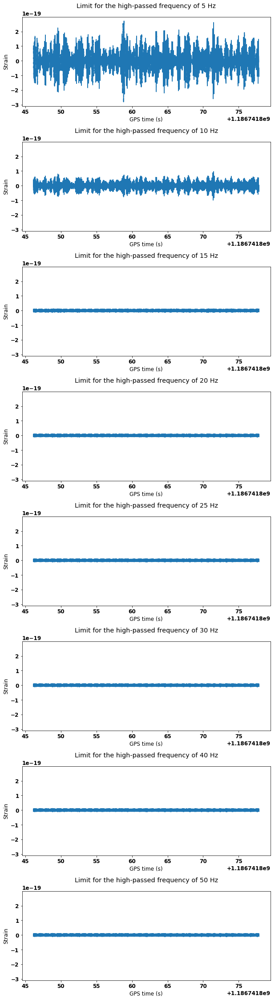

In [14]:
low_freq=[5,10,15,20,25,30,40,50]
high_passed=[0 for i in range(len(low_freq))]
f=plt.figure(figsize=[10,30])
f.subplots_adjust(bottom=18, top=19, wspace= 0.4, hspace=0.4)
ax=f.subplots(nrows=len(low_freq), sharey=True)
for i in range(len(low_freq)):
    high_passed[i]=data.highpass_fir(low_freq[i], 512)
    ax[i].plot(high_passed[i].sample_times, high_passed[i])
    ax[i].set_title("Limit for the high-passed frequency of %i Hz" %low_freq[i], pad=20)
    ax[i].set_xlabel("GPS time (s)")
    ax[i].set_ylabel("Strain")
    
    

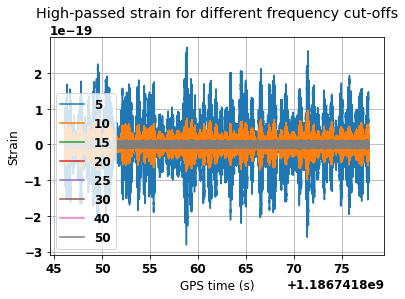

In [15]:
for i in range(len(low_freq)):
    plt.plot(high_passed[i].sample_times, high_passed[i], label=low_freq[i])
plt.title("High-passed strain for different frequency cut-offs", pad=20)
plt.xlabel("GPS time (s)")
plt.ylabel("Strain")
plt.grid()
plt.legend(loc="best")

In order to be able to go furter in the analysis, we need to use the PSD of the data. So we can whiten and look at the Qtransform of the function and the different cases. 

For a first approach, it can be interesting to only look at the difference for the highpass filter. After that, only the lowpass can be changed. Then, it could be an idea to look at how the combination of both can/will change the result. Basically, it seems probable that the difference will not be that big if the GW signal is not cut out of the problem. On the other hand, if the frequencies are not well chosen and that there is a cut off of the data, it is probable that the signal will disapear.

For the PSD, we take a time interval of 3 as it has been determined to be the one giving the best possible SNR.

In [16]:
ont = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 8}

matplotlib.rc('font', **font)

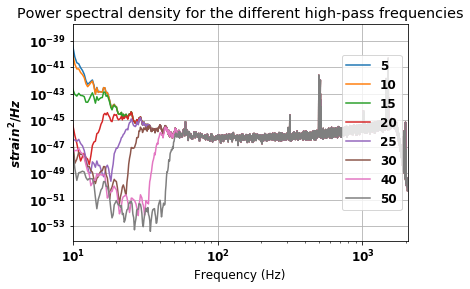

In [17]:
psds=[0 for i in range(len(high_passed))]
for i in range(len(high_passed)):
    psd=high_passed[i].psd(3)
    plt.loglog(psd.sample_frequencies, psd, label=low_freq[i])
    psds[i]=psd
plt.xlabel("Frequency (Hz)")
plt.ylabel("$strain^2/Hz$")
plt.xlim(10,2048)
plt.legend(loc="right")
plt.title("Power spectral density for the different high-pass frequencies")
plt.grid()

We see that, for the heighest frequency cut-offs, te PSD gores to really low values in the detector. It is not stable as there are some movements in the data. However, each time, above the frequency-cut off the PSD simply goes back to the plateau value which was already present in the classical data analysis. Note that this value of the plateau is exacty the same (10^-46). This seems coherant. It could seem a good idea to reduce the noise. However, it important to keep in mind that the signal from the gravitational wave will be take out of the data as well. So, the detection will not forcely be better by redusing that much the noise.

We can represent the different cases separatedly

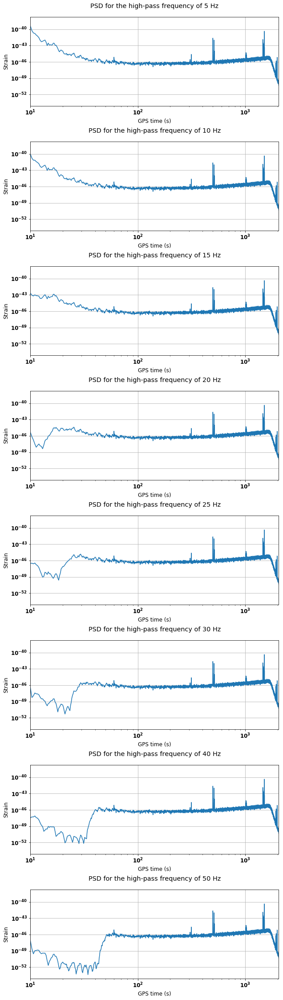

In [18]:
f=plt.figure(figsize=[10,30])
f.subplots_adjust(bottom=18, top=19, wspace= 0.4, hspace=0.4)
ax=f.subplots(nrows=len(low_freq), sharey=True)
for i in range(len(low_freq)):
    ax[i].loglog(psds[i].sample_frequencies, psds[i])
    ax[i].set_title("PSD for the high-pass frequency of %i Hz" %low_freq[i], pad=20)
    ax[i].set_xlabel("GPS time (s)")
    ax[i].set_xlim(10,2048)
    ax[i].set_ylabel("Strain")
    ax[i].grid()

The next step of the analysis is to whiten the data, based on the psds that have been calculated in the previous step.

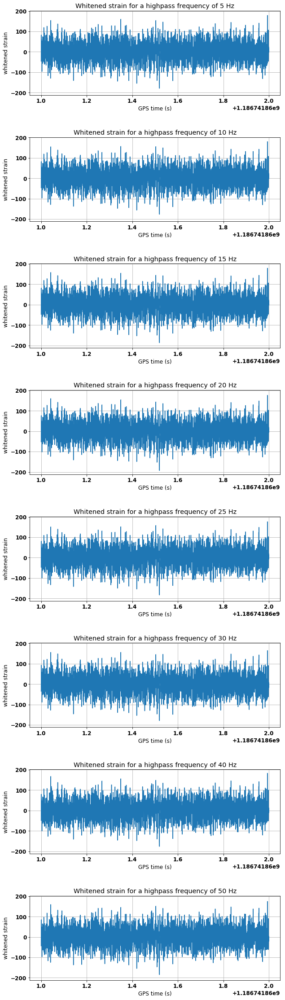

In [19]:
whitened_passed=[0 for i in range(len(low_freq))]
f=plt.figure(figsize=[10,15])
ax=f.subplots(nrows=len(low_freq), sharey=True)
f.subplots_adjust(bottom=18, top=20, wspace= 0.4, hspace=0.5)
j=0
for i in range(len(low_freq)):
    whitened_passed[i]=high_passed[i].whiten(3,3)
    zoom=whitened_passed[i].time_slice(m.time-0.5, m.time+0.5)
    ax[j].plot(zoom.sample_times, zoom)
    ax[j].set_xlabel("GPS time (s)")
    ax[j].set_ylabel("whitened strain")
    ax[j].set_title("Whitened strain for a highpass frequency of %i Hz" %low_freq[i])
    ax[j].grid()
    j+=1

When looking at the different plots separatadely, there seems to be no difference between all te whitened plotss. In order to check this impression, we can plot all on the same graph and see if there are some remarquable features that will appear

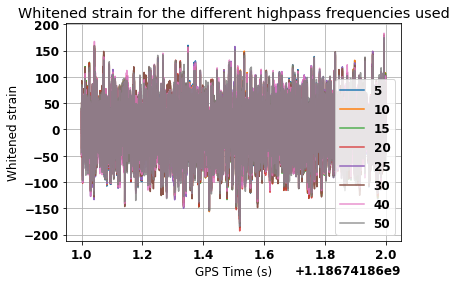

In [20]:
alphas=[1,1,0.8,0.8,1,1,0.8,0.8]
for i in range(len(low_freq)):
    zoom=whitened_passed[i].time_slice(m.time-0.5, m.time+0.5)
    plt.plot(zoom.sample_times, zoom, alpha=alphas[i], label=low_freq[i])
plt.xlabel("GPS Time (s)")
plt.ylabel("Whitened strain")
plt.title("Whitened strain for the different highpass frequencies used")
plt.legend(loc="best")
plt.grid()

By looking closely, it is possible to see that some peaks are a bit broader for the lwoer frequency cutt-offs than for the others. However, so far, nothing seems to be really conclusive for the different cases

In order to have a better view of the data, it can be bandpassed. Therefore, we only let some frequnecies under a given limit. We take the low pass filter with a 250Hz cut off. Here, we do not change this frequency with respect to the classical analysis done. Therefore, we keep 250Hz and a 512Hz half sample slice.

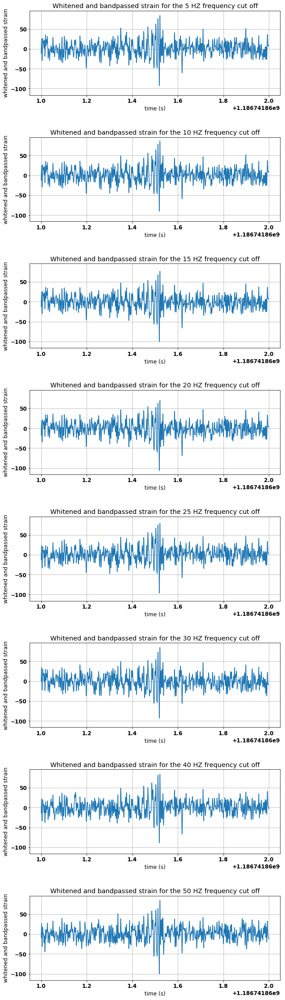

In [21]:
bsps=[0 for i in range(len(low_freq))]
f=plt.figure(figsize=[10,15])
ax=f.subplots(nrows=len(low_freq), sharey=True)
f.subplots_adjust(bottom=18, top=20, wspace= 0.4, hspace=0.5)
j=0

for i in range(len(low_freq)):
    bsps[i]=whitened_passed[i].lowpass_fir(250,512)
    zoom=bsps[i].time_slice(m.time-0.5, m.time+0.5)
    ax[j].plot(zoom.sample_times, zoom)
    ax[j].set_xlabel("time (s)")
    ax[j].set_ylabel("whitened and bandpassed strain")
    ax[j].set_title("Whitened and bandpassed strain for the %i HZ frequency cut off" %low_freq[i])
    ax[j].grid()
    j+=1

There seems to be some difference woth again some peaks going z bit higher or lower in some cases. The thrre peaks that  can be seen in the event are a bit different als well. However, in each case, the signature of the event can still clearly be seen.

In order to see if the differences are more significant than expected, we look at the superposition of all the different time slices on top of each other.

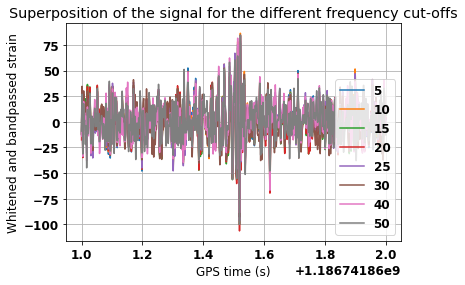

In [22]:
for i in range(len(low_freq)):
    zoom=bsps[i].time_slice(m.time-0.5, m.time+0.5)
    plt.plot(zoom.sample_times, zoom, label=low_freq[i])
plt.xlabel("GPS time (s)")
plt.ylabel("Whitened and bandpassed strain")
plt.title("Superposition of the signal for the different frequency cut-offs")
plt.legend(loc="best")
plt.grid()

Even if the figure is not clear, one sees that there are some differences between the different cases. Some are a bit more noisy, or wider,... The signal is not totally different. The signature of the event seems to still be easily seeable.

We can zoom event more on the data in order to see what it looks like. Note that the cutoff of 30sec is the one that has been used for the calssical analysis.

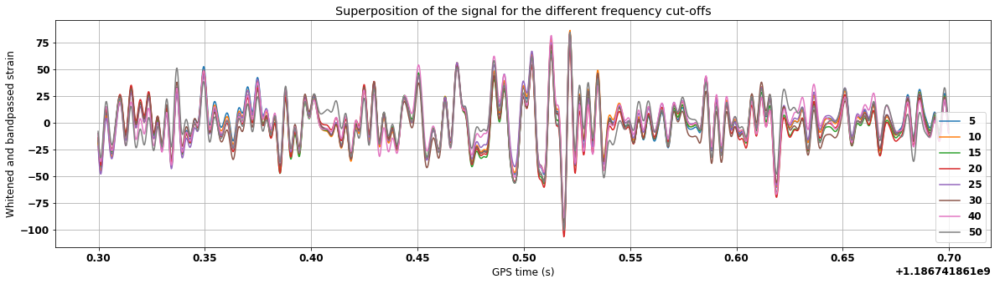

In [23]:
f=plt.figure(figsize=(20,5))
for i in range(len(low_freq)):
    zoom=bsps[i].time_slice(m.time-0.2, m.time+0.2)
    plt.plot(zoom.sample_times, zoom, label=low_freq[i])
plt.xlabel("GPS time (s)")
plt.ylabel("Whitened and bandpassed strain")
plt.title("Superposition of the signal for the different frequency cut-offs")
plt.legend(loc="best")
plt.grid()

There are slight mismatches between the different cases. However, the global shape seems to remain the same. It is difficult to say something so far.

In order to have a better view, it can be interesting to put the different cases the one under the under. Nevertheless, it seems that the siferences are too small to be really observable by doing so.

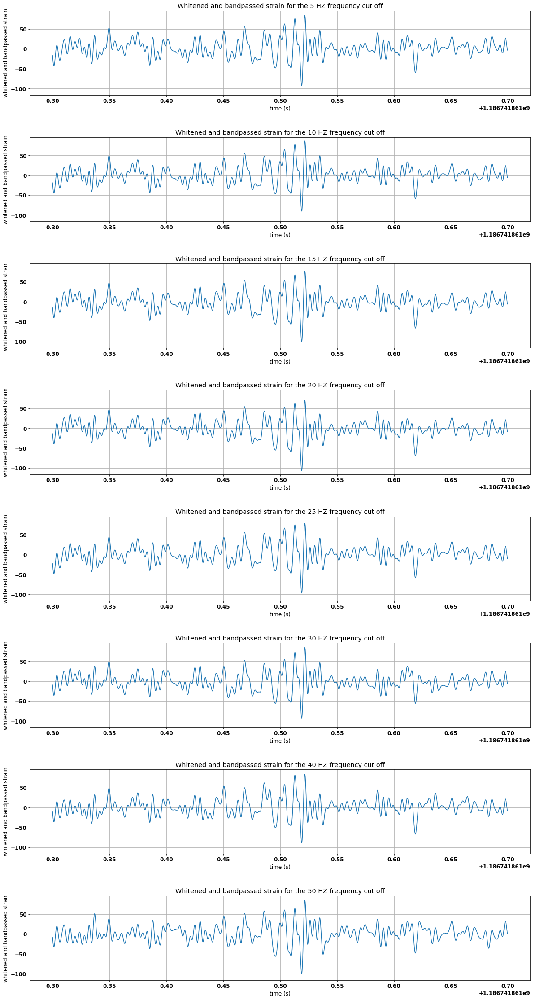

In [24]:
f=plt.figure(figsize=[20,15])
ax=f.subplots(nrows=len(low_freq), sharey=True)
f.subplots_adjust(bottom=18, top=20, wspace= 0.4, hspace=0.5)
j=0

for i in range(len(low_freq)):
    zoom=bsps[i].time_slice(m.time-0.2, m.time+0.2)
    ax[j].plot(zoom.sample_times, zoom)
    ax[j].set_xlabel("time (s)")
    ax[j].set_ylabel("whitened and bandpassed strain")
    ax[j].set_title("Whitened and bandpassed strain for the %i HZ frequency cut off" %low_freq[i])
    ax[j].grid()
    j+=1

Globally, it seems that it remains more or less the same, except for the width of the signal. For example, the downward peak around the time of the event is the lowest for the 20Hz case. So far, it is not significant.

In order to have a clearer view of the signal and what happens, we can make the Qtransform for the different case.

/home/justin/.local/lib/python2.7/site-packages/matplotlib/axes/_base.py:3477: UserWarning: Attempted to set non-positive ylimits for log-scale axis; invalid limits will be ignored.
  'Attempted to set non-positive ylimits for log-scale axis; '


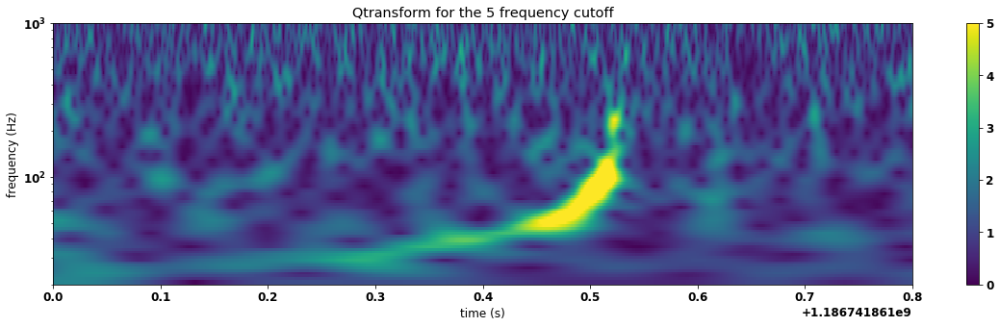

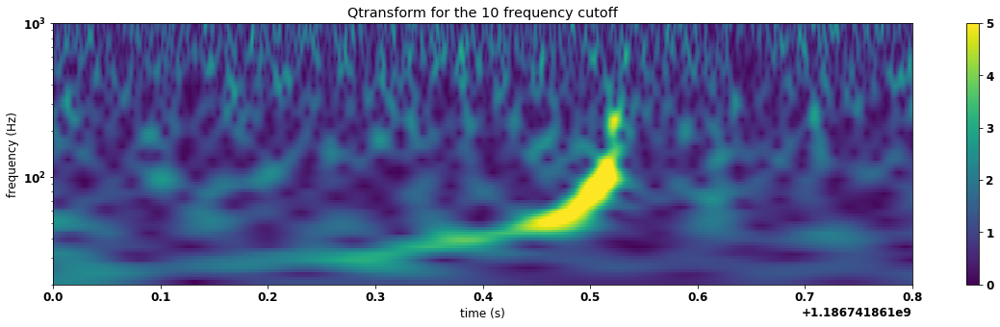

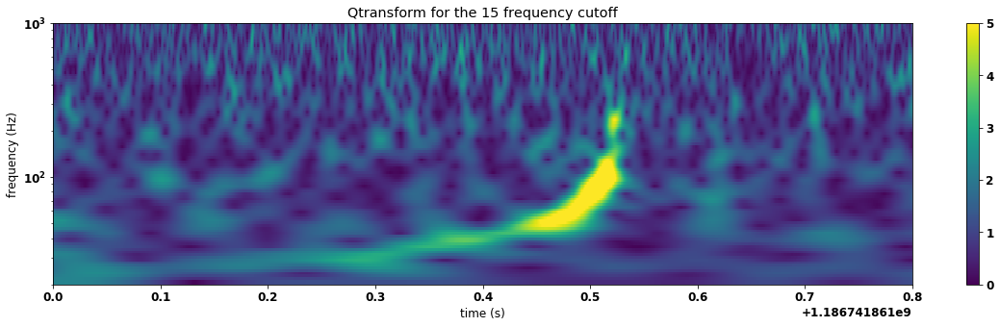

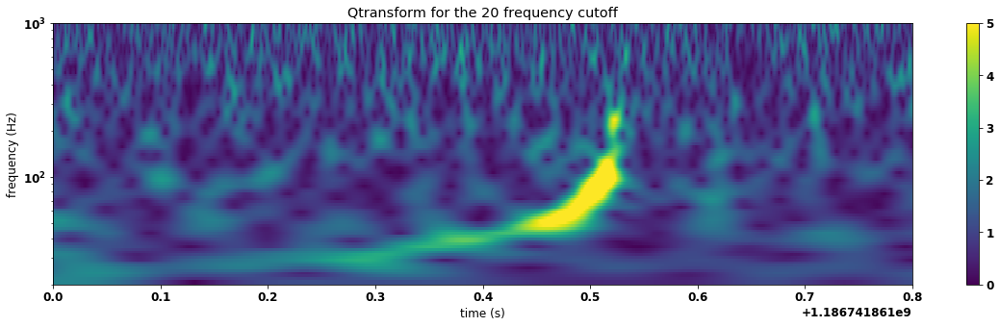

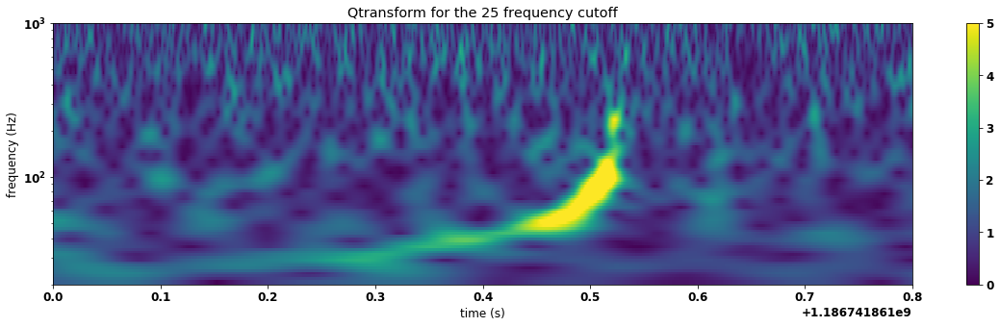

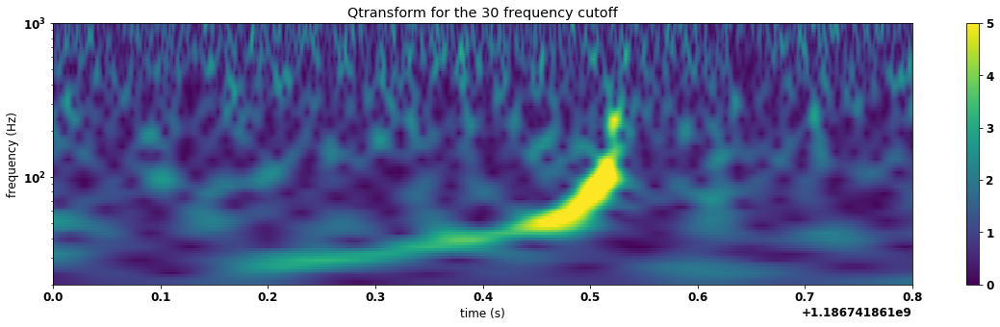

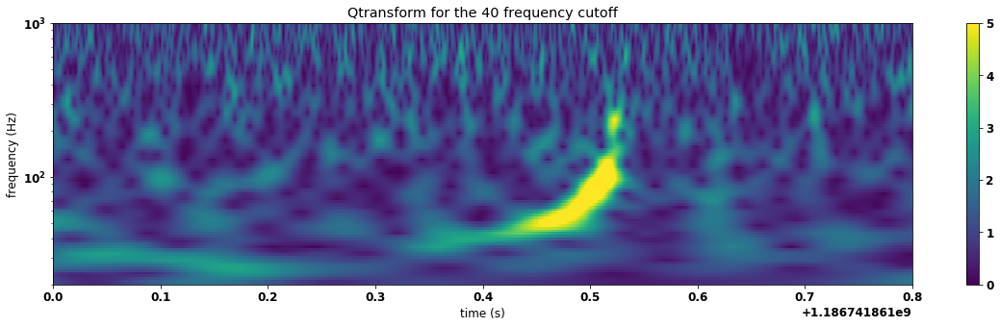

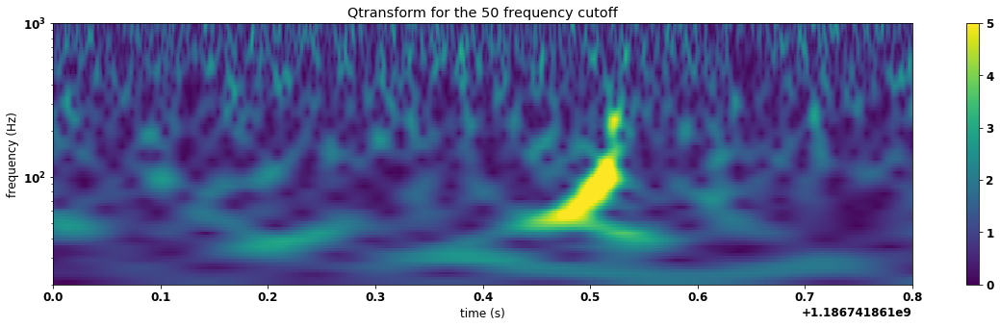

In [25]:
for i in range(len(low_freq)):
    zoom=whitened_passed[i].time_slice(m.time-5, m.time+5)
    times, freqs, power = zoom.qtransform(0.001, logfsteps=100 , qrange=(10,10), frange=(20,1000))
    plt.figure(figsize=(20,5))
    plt.pcolormesh(times, freqs, power**0.5, vmin=0, vmax=5)
    plt.xlim(m.time-0.5, m.time+0.3)
    plt.title("Qtransform for the %i frequency cutoff" %low_freq[i])
    plt.yscale('log')
    plt.xlabel("time (s)")
    plt.ylabel("frequency (Hz)")
    plt.ylim(0,1000)
    plt.colorbar()

The banana shape remains well present in this case. However, for 40 and 50 HZ, one can observe that the long inspiral part of the event is taken away. This means that we miss a part of the event by using this. So, ot can be interesting to look at what happens in the frame of the SNR for these different cases.

We found a signal at 1186741861.5244141s with a SNR of 12.7389989 for the 5 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7532883 for the 10 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7558288 for the 15 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.6303018 for the 20 Hz frequency cutoff
We found a signal at 1186741855.7783203s with a SNR of 7.7884898 for the 25 Hz frequency cutoff
We found a signal at 1186741869.7451172s with a SNR of 3.2869577 for the 30 Hz frequency cutoff
We found a signal at 1186741871.1215820s with a SNR of 3.8189743 for the 40 Hz frequency cutoff
We found a signal at 1186741856.5961914s with a SNR of 3.6160913 for the 50 Hz frequency cutoff


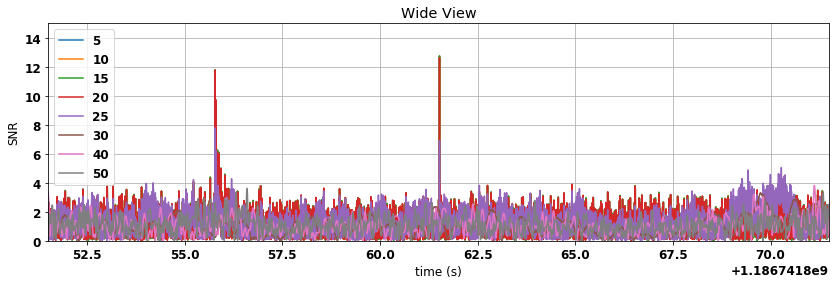

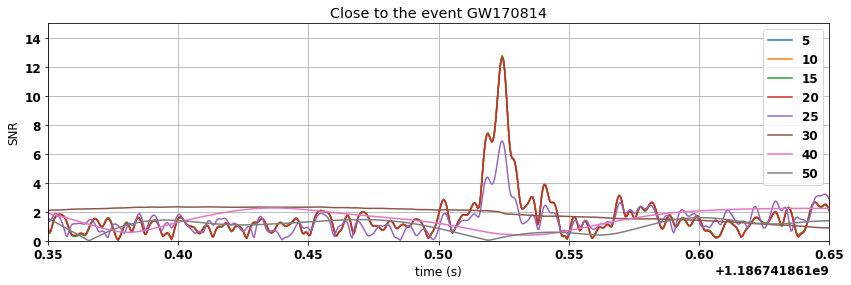

In [26]:
from pycbc.filter import resample_to_delta_t, highpass
from pycbc.psd import interpolate, inverse_spectrum_truncation
from pycbc.waveform import get_fd_waveform
from pycbc.filter import matched_filter
import numpy

m= Merger("GW170814")
data=m.strain('L1')
low_freq=[5,10,15,20,25,30,40,50]
high_passed=[0 for i in range(len(low_freq))]
psds=[0 for i in range(len(high_passed))]
snr=[0 for i in range(len(high_passed))]
peaks=[0 for i in range(len(high_passed))]
snrp=[0 for i in range(len(high_passed))]
times=[0 for i in range(len(high_passed))]

for i in range(len(low_freq)):
    #data conditioning
    high_passed[i]=data.highpass_fir(low_freq[i], 512)
    high_passed[i]=resample_to_delta_t(high_passed[i], 1.0/2048)
    high_passed[i].crop(2,2)
    #psd calculation
    psd=high_passed[i].psd(3)
    psd=interpolate(psd, high_passed[i].delta_f)
    psd=inverse_spectrum_truncation(psd, 2*high_passed[i].sample_rate, low_frequency_cutoff=15.0)
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=high_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, high_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 

for w, title in [(10, 'Wide View'), (.15, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(low_freq)):
        plt.plot(snr[i].sample_times, abs(snr[i]), label=low_freq[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), low_freq[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.ylim(0,15)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

On the most zoomed figure, one sees that for the duration inferior to 25HZ, the peak has the same height. For 25 HZ, it is less high and it seems to disapear for the other cutoffs.

In order to have a beter idea, we represent all the zoomed cases the one under the others.

We found a signal at 1186741861.5244141s with a SNR of 12.7389989 for the 5 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7532883 for the 10 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7558288 for the 15 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.6303018 for the 20 Hz frequency cutoff
We found a signal at 1186741855.7783203s with a SNR of 7.7884898 for the 25 Hz frequency cutoff
We found a signal at 1186741869.7451172s with a SNR of 3.2869577 for the 30 Hz frequency cutoff
We found a signal at 1186741871.1215820s with a SNR of 3.8189743 for the 40 Hz frequency cutoff
We found a signal at 1186741856.5961914s with a SNR of 3.6160913 for the 50 Hz frequency cutoff


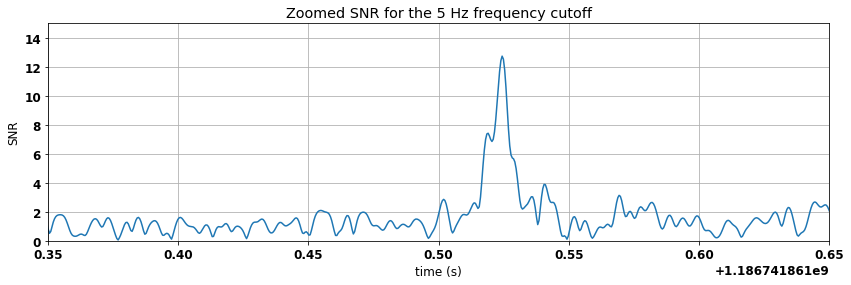

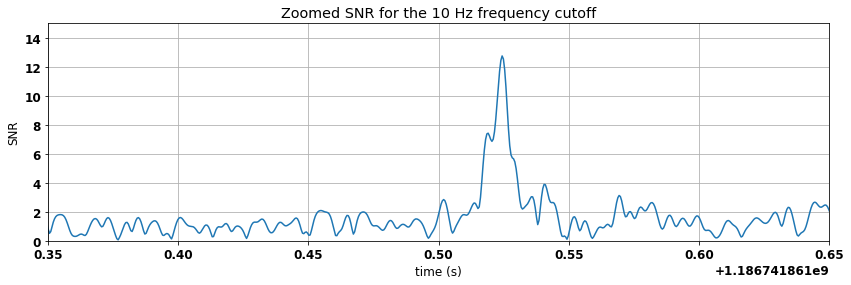

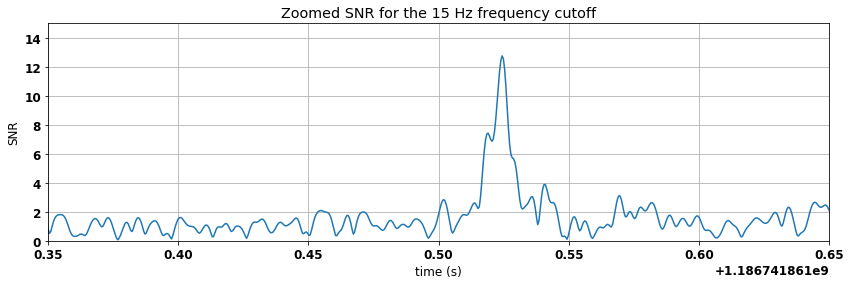

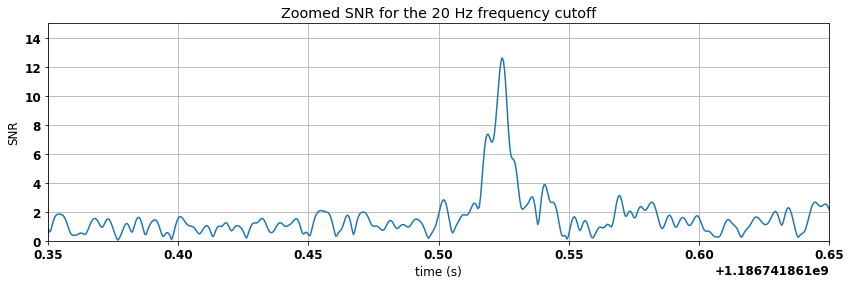

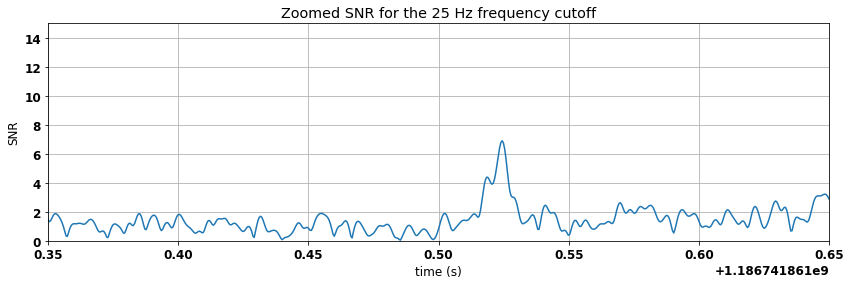

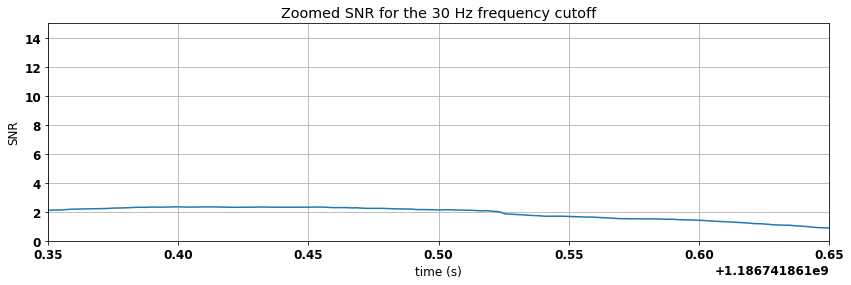

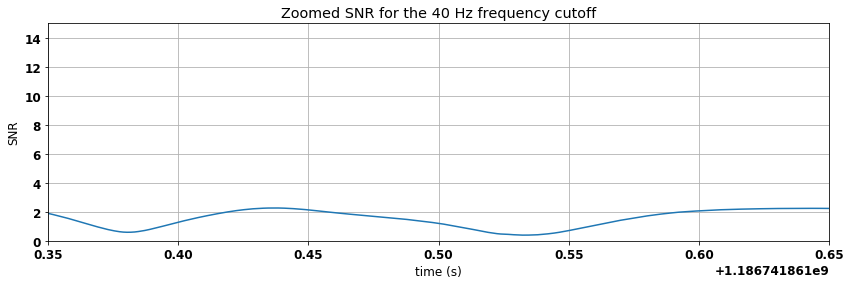

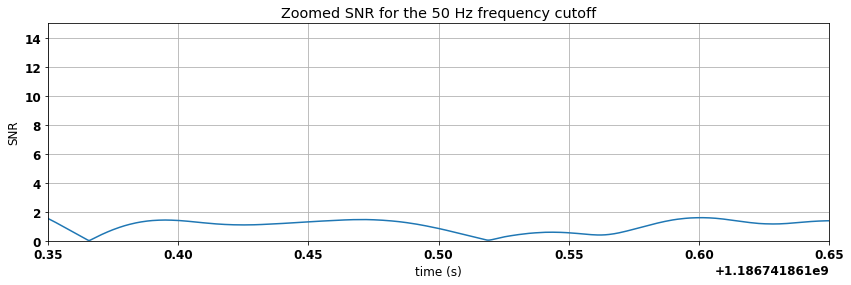

In [27]:
for i in range(len(low_freq)):
    plt.figure(figsize=(14,4))
    plt.plot(snr[i].sample_times, abs(snr[i]), label=low_freq[i])
    peaks[i]=abs(snr[i]).numpy().argmax()
    snrp[i]=snr[i][peaks[i]]
    times[i]=snr[i].sample_times[peaks[i]]
    print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), low_freq[i]))
    plt.title("Zoomed SNR for the %i Hz frequency cutoff" %low_freq[i])
    plt.grid()
    plt.xlim(m.time-0.15, m.time+0.15)
    plt.ylim(0,15)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We found a signal at 1186741861.5244141s with a SNR of 12.7389989 for the 5 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7532883 for the 10 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7558288 for the 15 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.6303018 for the 20 Hz frequency cutoff
We found a signal at 1186741855.7783203s with a SNR of 7.7884898 for the 25 Hz frequency cutoff
We found a signal at 1186741869.7451172s with a SNR of 3.2869577 for the 30 Hz frequency cutoff
We found a signal at 1186741871.1215820s with a SNR of 3.8189743 for the 40 Hz frequency cutoff
We found a signal at 1186741856.5961914s with a SNR of 3.6160913 for the 50 Hz frequency cutoff


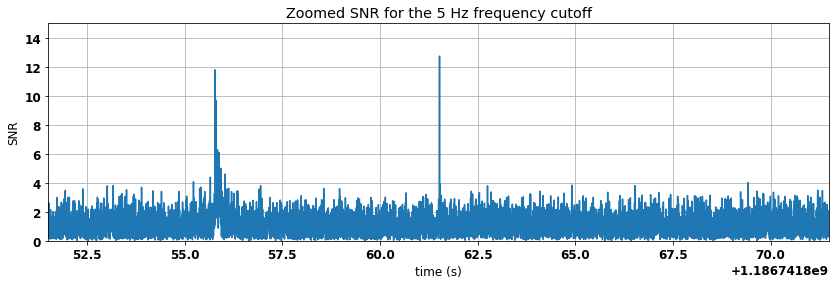

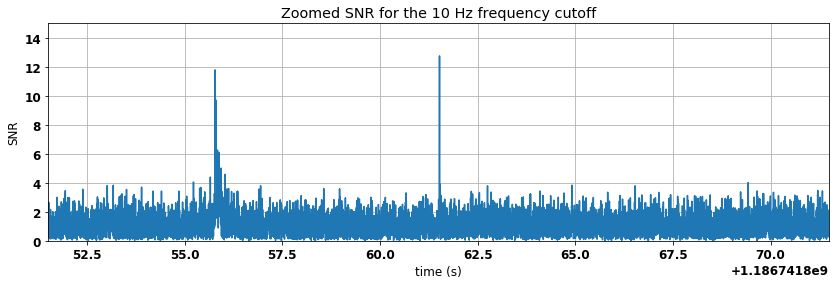

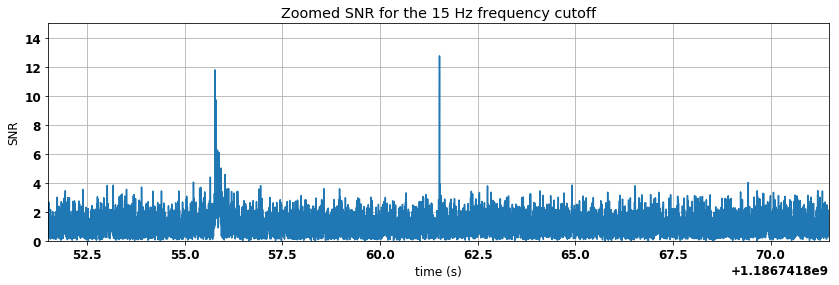

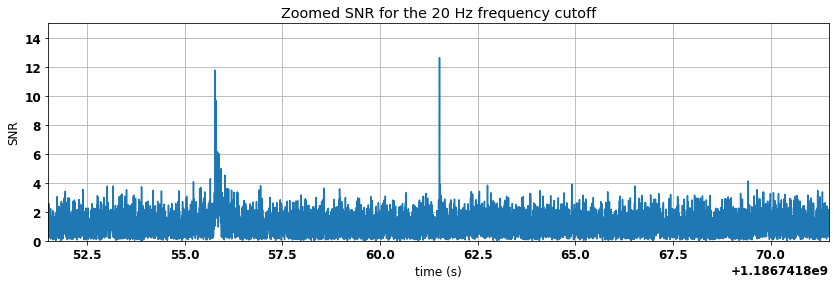

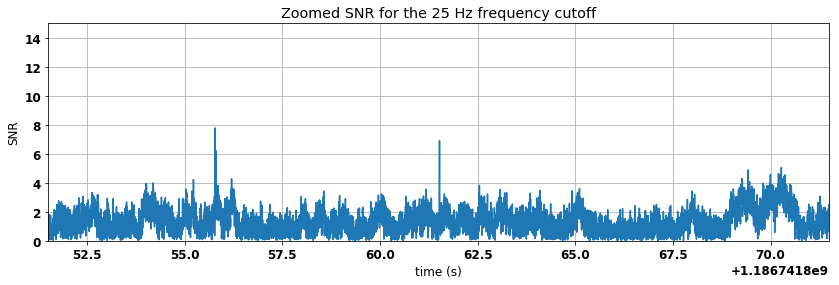

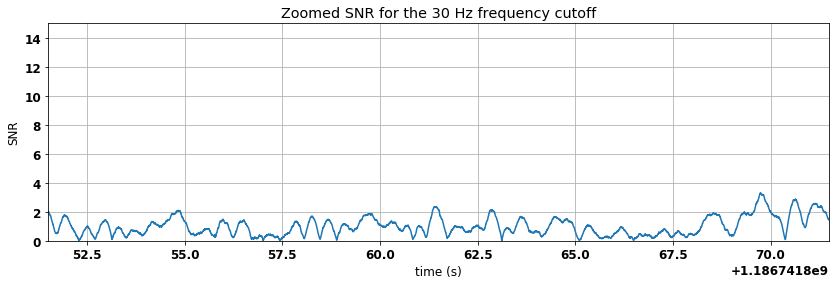

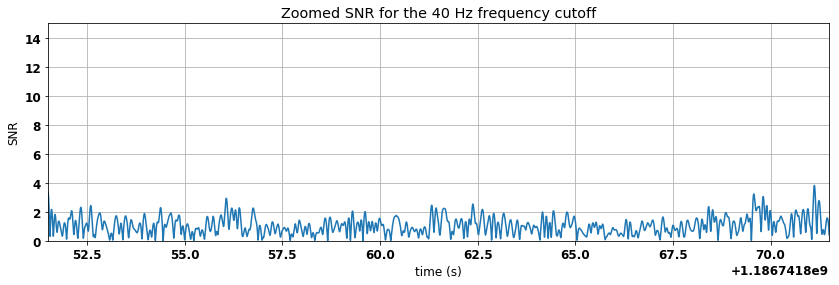

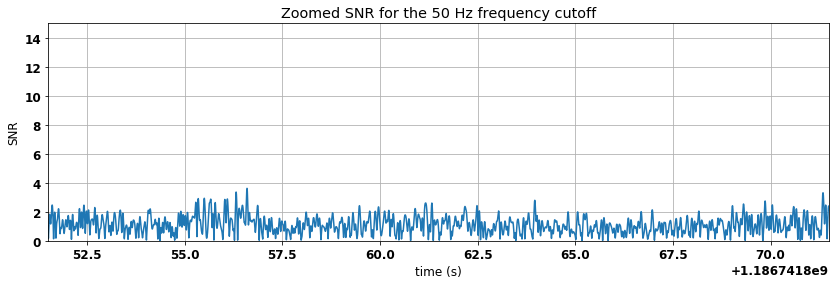

In [28]:
#same but for a wider view
for i in range(len(low_freq)):
    plt.figure(figsize=(14,4))
    plt.plot(snr[i].sample_times, abs(snr[i]), label=low_freq[i])
    peaks[i]=abs(snr[i]).numpy().argmax()
    snrp[i]=snr[i][peaks[i]]
    times[i]=snr[i].sample_times[peaks[i]]
    print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), low_freq[i]))
    plt.title("Zoomed SNR for the %i Hz frequency cutoff" %low_freq[i])
    plt.grid()
    plt.xlim(m.time-10, m.time+10)
    plt.ylim(0,15)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We see that any sigh of the signal disapear when we cut off a part of the signal. This can an be seen as the part where the inspiral is removed. However, it is important to note that it also removes other parts of the signal. In fact, when to much frequency is removed, a part of the signal is probably destroyed. 

When doing the stduy of the influence of the lowpass frequency, it was possible to show that the value of the beta parameter used in the filter changes the final result. So, we can see gere if the still decrease that much for the highpass of 25Hz, as function of the beta parameter that is used

We found a signal at 1186741855.7783203s with a SNR of 4.7194892 for the 25Hz frequency cutoff and a value of beta of 1.0
We found a signal at 1186741855.7783203s with a SNR of 7.7884898 for the 25Hz frequency cutoff and a value of beta of 5.0
We found a signal at 1186741861.5244141s with a SNR of 10.6899582 for the 25Hz frequency cutoff and a value of beta of 10.0
We found a signal at 1186741861.5244141s with a SNR of 12.1280243 for the 25Hz frequency cutoff and a value of beta of 100.0
We found a signal at 1186741861.5244141s with a SNR of 12.1371446 for the 25Hz frequency cutoff and a value of beta of 300.0


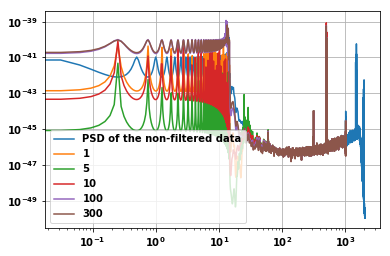

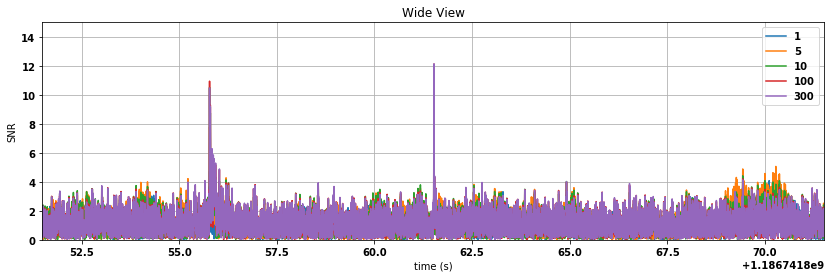

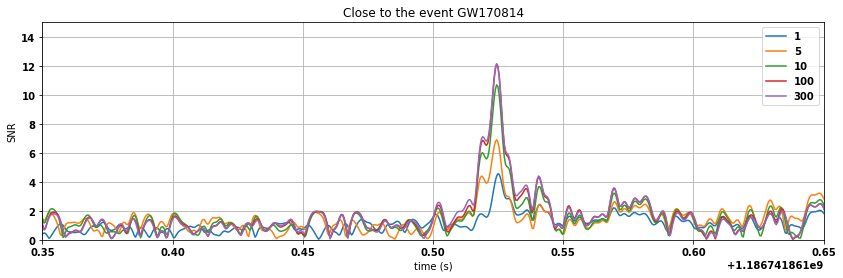

In [66]:
m= Merger("GW170814")
data=m.strain('L1')
betas = [ 1, 5, 10, 100, 300]
high_passed=[0 for i in range(len(betas))]
psds=[0 for i in range(len(high_passed))]
snr=[0 for i in range(len(high_passed))]
peaks=[0 for i in range(len(high_passed))]
snrp=[0 for i in range(len(high_passed))]
times=[0 for i in range(len(high_passed))]

ps = data.psd(3)
ps = interpolate(ps, data.delta_f)
ps = inverse_spectrum_truncation(ps, 2*data.sample_rate, low_frequency_cutoff = 15.0)
plt.loglog(ps.sample_frequencies, ps, label="PSD of the non-filtered data")

for i in range(len(betas)):
    #data conditioning
    high_passed[i]=data.highpass_fir(25, 512, beta = betas[i])
    high_passed[i]=resample_to_delta_t(high_passed[i], 1.0/2048)
    high_passed[i].crop(2,2)
    #psd calculation
    psd=high_passed[i].psd(3)
    psd=interpolate(psd, high_passed[i].delta_f)
    psd=inverse_spectrum_truncation(psd, 2*high_passed[i].sample_rate, low_frequency_cutoff=15.0)
    plt.loglog(psd.sample_frequencies, psd, label = betas[i])
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=high_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, high_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 
plt.grid()
plt.legend()

for w, title in [(10, 'Wide View'), (.15, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(betas)):
        plt.plot(snr[i].sample_times, abs(snr[i]), label=betas[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the 25Hz frequency cutoff and a value of beta of %.1f" %(times[i], abs(snrp[i]), betas[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.ylim(0,15)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

With the beta parameter set at 0.1, 1, 5 it is still possible to find the signal with 25Hz frequency cut-off, without any problem. So, we can look at how far we can go in the cutoff by using a beta parameter that is set at 1

We found a signal at 1186741861.5244141s with a SNR of 12.1371446 for the 25 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 11.7849148 for the 30 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 10.5900918 for the 40 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 8.7594101 for the 50 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 6.8061275 for the 60 Hz frequency cutoff
We found a signal at 1186741861.5249023s with a SNR of 5.2944039 for the 70 Hz frequency cutoff
We found a signal at 1186741856.2475586s with a SNR of 4.8332115 for the 80 Hz frequency cutoff
We found a signal at 1186741856.2509766s with a SNR of 4.9788655 for the 90 Hz frequency cutoff
We found a signal at 1186741852.7827148s with a SNR of 9.0327901 for the 100 Hz frequency cutoff


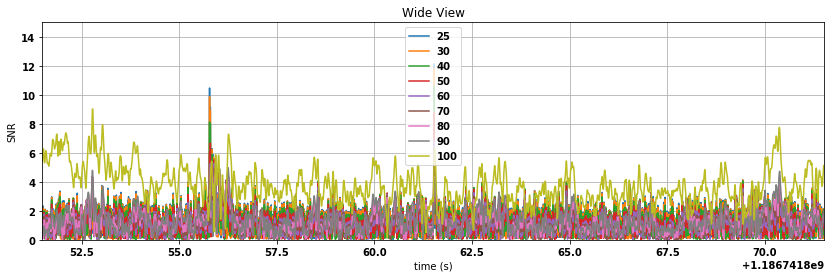

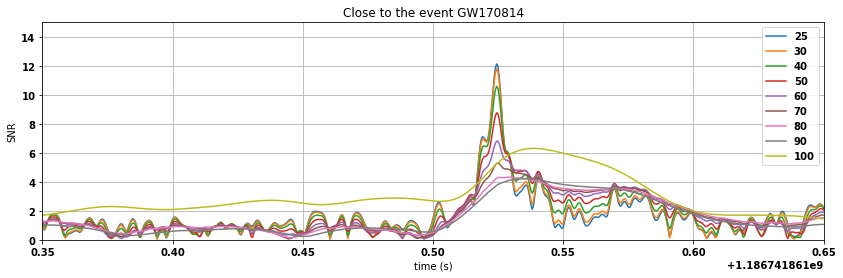

In [88]:
m= Merger("GW170814")
data=m.strain('L1')
low_freq=[25,30,40,50, 60, 70, 80, 90, 100]
high_passed=[0 for i in range(len(low_freq))]
psds=[0 for i in range(len(high_passed))]
snr=[0 for i in range(len(high_passed))]
peaks=[0 for i in range(len(high_passed))]
snrp=[0 for i in range(len(high_passed))]
times=[0 for i in range(len(high_passed))]

for i in range(len(low_freq)):
    #data conditioning
    high_passed[i]=data.highpass_fir(low_freq[i], 512, beta = 300)
    high_passed[i]=resample_to_delta_t(high_passed[i], 1.0/2048)
    high_passed[i].crop(2,2)
    #psd calculation
    psd=high_passed[i].psd(3)
    psd=interpolate(psd, high_passed[i].delta_f)
    psd=inverse_spectrum_truncation(psd, 2*high_passed[i].sample_rate, low_frequency_cutoff=15.0)
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=high_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, high_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 

for w, title in [(10, 'Wide View'), (.15, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(low_freq)):
        plt.plot(snr[i].sample_times, abs(snr[i]), label=low_freq[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), low_freq[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.ylim(0,15)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We found a signal at 1186741861.5244141s with a SNR of 12.7266152 for the 1 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.6240644 for the 10 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.3717051 for the 20 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.1371446 for the 25 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 11.7849148 for the 30 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 10.5900918 for the 40 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 8.7594101 for the 50 Hz frequency cutoff


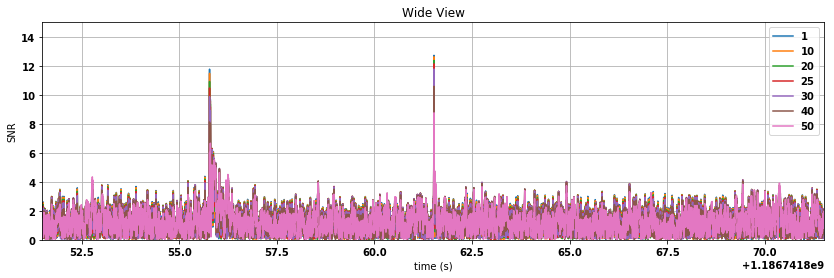

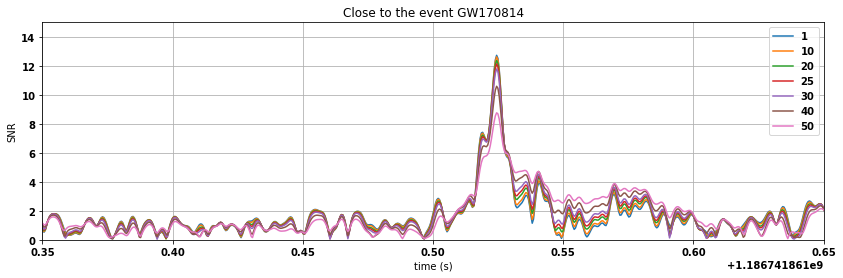

In [90]:
m= Merger("GW170814")
data=m.strain('L1')
low_freq=[1,10,20, 25,30,40,50]
high_passed=[0 for i in range(len(low_freq))]
psds=[0 for i in range(len(high_passed))]
snr=[0 for i in range(len(high_passed))]
peaks=[0 for i in range(len(high_passed))]
snrp=[0 for i in range(len(high_passed))]
times=[0 for i in range(len(high_passed))]

for i in range(len(low_freq)):
    #data conditioning
    high_passed[i]=data.highpass_fir(low_freq[i], 512, beta = 300)
    high_passed[i]=resample_to_delta_t(high_passed[i], 1.0/2048)
    high_passed[i].crop(2,2)
    #psd calculation
    psd=high_passed[i].psd(3)
    psd=interpolate(psd, high_passed[i].delta_f)
    psd=inverse_spectrum_truncation(psd, 2*high_passed[i].sample_rate, low_frequency_cutoff=15.0)
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=high_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, high_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 

for w, title in [(10, 'Wide View'), (.15, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(low_freq)):
        plt.plot(snr[i].sample_times, abs(snr[i]), label=low_freq[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), low_freq[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.ylim(0,15)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

# Highpass frequency influence

In the previous section, we have looked at the influence of the low pass frequency used. However, there is also a high pass frequency which is used. Therefore, it can be interesting to see if there are the same trends, with a destruction of the signal when the too much frequency is taken out. 

For this part, only the low frequency is modified. The high-pass frequency remains the same, fixed at 15Hz. By looking at the Q-transform of the ecent, on sees that the signal seems to go up to approximatively a frequency of 300Hz. In the examples done previously, the lowpass was done with a frequency cutoff of 250 Hz.

Before, the lowpass was done after the PSD calculation. Here, it is done directly onto the data, so that the data is clearly totally bandpassed from the start.

In [31]:
%matplotlib inline 

#first we need to set bigger characters for the titles, labels and thicks.
import matplotlib
import matplotlib.pyplot as plt
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 12}

matplotlib.rc('font', **font)

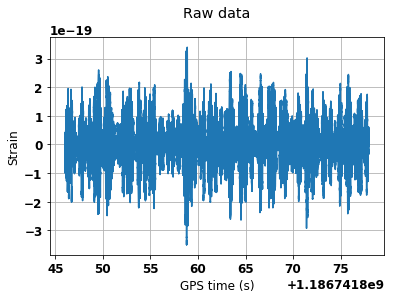

In [32]:
from pycbc.catalog import Merger
m= Merger("GW170814")
data=m.strain('L1')
plt.plot(data.sample_times, data)
plt.xlabel("GPS time (s)")
plt.ylabel("Strain")
plt.title('Raw data', pad=20)
plt.grid()

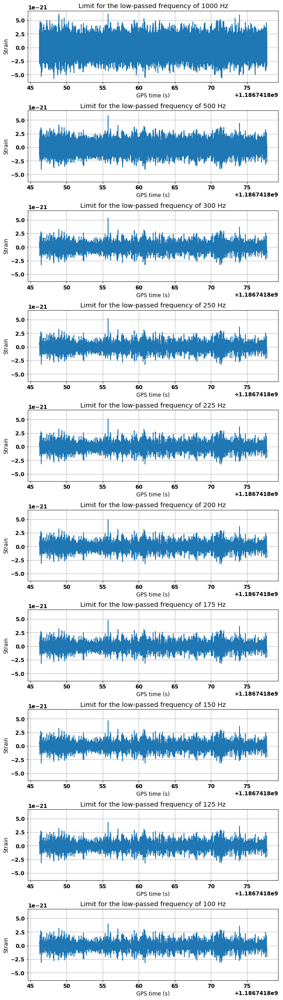

In [33]:


high_freq=[1000,500,300,250,225,200,175,150,125,100]
low_passed=[0 for i in range(len(high_freq))]
f=plt.figure(figsize=[10,30])
f.subplots_adjust(bottom=18, top=19, wspace= 0.4, hspace=0.4)
ax=f.subplots(nrows=len(high_freq), sharey=True)
for i in range(len(high_freq)):
    low_passed[i]=data.highpass_fir(15,512).lowpass_fir(high_freq[i], 512)
    ax[i].plot(low_passed[i].sample_times, low_passed[i])
    ax[i].set_title("Limit for the low-passed frequency of %i Hz" %high_freq[i])
    ax[i].set_xlabel("GPS time (s)")
    ax[i].set_ylabel("Strain")
    ax[i].grid()

One can see that the noise becomes less broad as the frquency cut off decreases. This is because the high frequency variations are talen out of the system. The difference may be better seen if the different datas are superposed

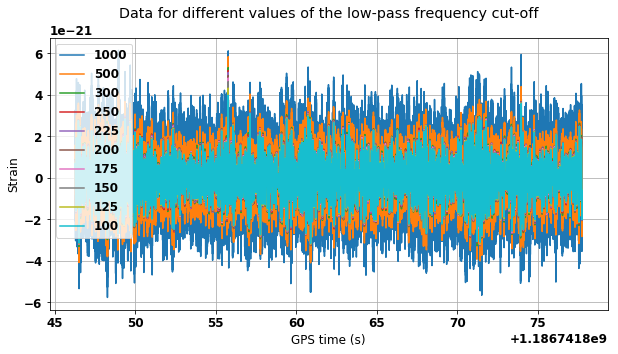

In [34]:
f=plt.figure(figsize=[10,5])
for i in range(len(high_freq)):
    plt.plot(low_passed[i].sample_times, low_passed[i], label=high_freq[i])
plt.title("Data for different values of the low-pass frequency cut-off", pad=20)
plt.xlabel("GPS time (s)")
plt.ylabel("Strain")
plt.grid()
plt.legend(loc='best')

One sees that, when the frequency cutoff decreases, the width of the data changes. However, it seems the the global shape remains the same. Th evet is not really seeable in such a figure.

Based on these different datas, we can calculate the PSD. Normally, the PSD is calculated without any lowpass frequency on the data. So, there is no drop.

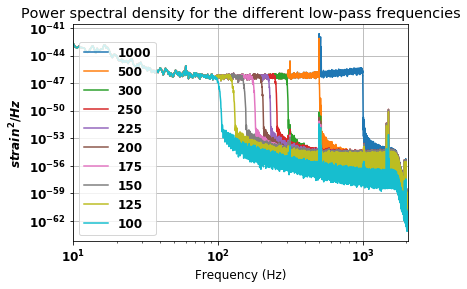

In [35]:
psds=[0 for i in range(len(low_passed))]
for i in range(len(low_passed)):
    psd=low_passed[i].psd(3)
    plt.loglog(psd.sample_frequencies, psd, label=high_freq[i])
    psds[i]=psd
plt.xlabel("Frequency (Hz)")
plt.ylabel("$strain^2/Hz$")
plt.xlim(10,2048)
plt.legend(loc="lower left")
plt.title("Power spectral density for the different low-pass frequencies")
plt.grid()

The PSD has a drop above the cut-off frequency, which is expected as it is removed. Before that, it remains the same and there is no difference. However, the change in the frequency cutoff has as consequence to remove some peaks that can be used for calibration, or, at least, seriously downgrade their value

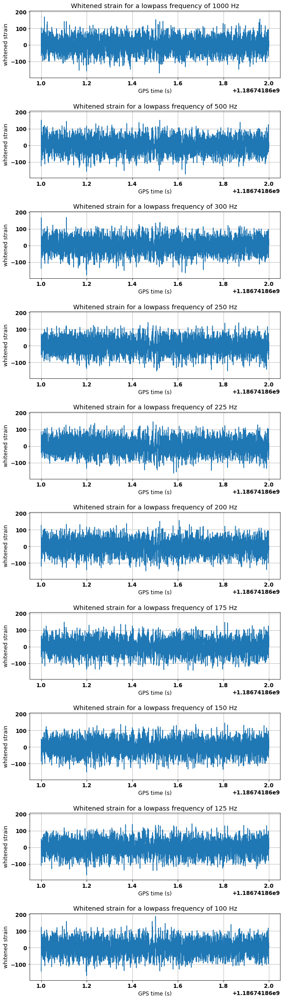

In [36]:
whitened_passed=[0 for i in range(len(high_freq))]
f=plt.figure(figsize=[10,15])
ax=f.subplots(nrows=len(high_freq), sharey=True)
f.subplots_adjust(bottom=18, top=20, wspace= 0.4, hspace=0.5)
j=0
for i in range(len(high_freq)):
    whitened_passed[i]=low_passed[i].whiten(3,3)
    zoom=whitened_passed[i].time_slice(m.time-0.5, m.time+0.5)
    ax[j].plot(zoom.sample_times, zoom)
    ax[j].set_xlabel("GPS time (s)")
    ax[j].set_ylabel("whitened strain")
    ax[j].set_title("Whitened strain for a lowpass frequency of %i Hz" %high_freq[i])
    ax[j].grid()
    j+=1

The peaks are not the same from one figure to the other. There are some that appear more in some cases than in the others, wihtout having a real trend about the the relation between peak and data. However, the mean width of the data seems to become less important

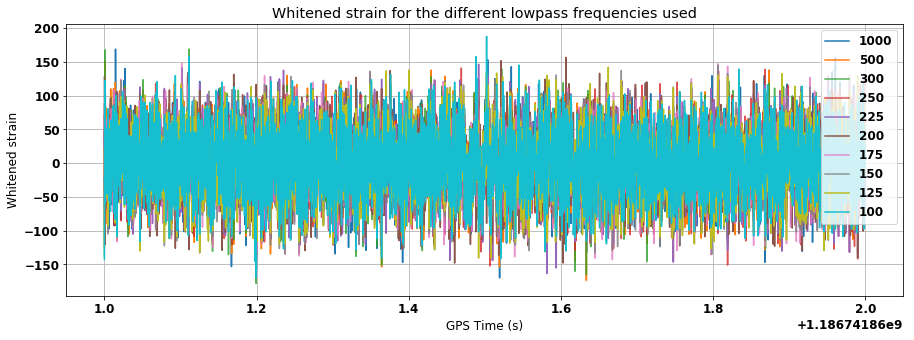

In [37]:
alphas=[1,1,0.8,0.8,1,1,0.8,0.8,1,1]
f=plt.figure(figsize=[15,5])
for i in range(len(high_freq)):
    zoom=whitened_passed[i].time_slice(m.time-0.5, m.time+0.5)
    plt.plot(zoom.sample_times, zoom, alpha=alphas[i], label=high_freq[i])
plt.xlabel("GPS Time (s)")
plt.ylabel("Whitened strain")
plt.title("Whitened strain for the different lowpass frequencies used")
plt.legend(loc="best")
plt.grid()

There is clearly no trend to be seen

We can clean more the low frequencies in order to have a better view on the event itself

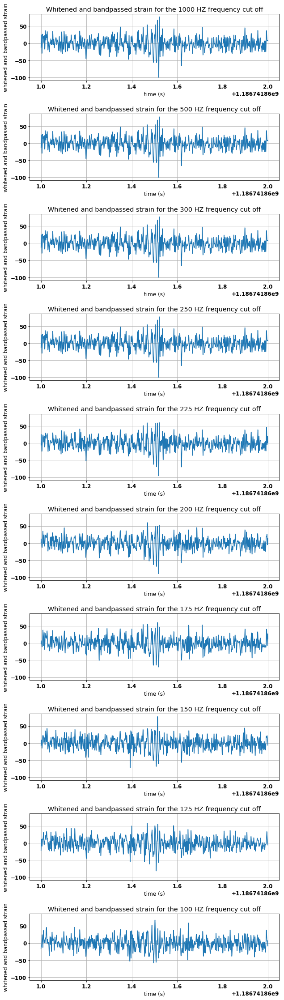

In [38]:
bsps=[0 for i in range(len(high_freq))]
f=plt.figure(figsize=[10,15])
ax=f.subplots(nrows=len(high_freq), sharey=True)
f.subplots_adjust(bottom=18, top=20, wspace= 0.4, hspace=0.5)
j=0

for i in range(len(high_freq)):
    bsps[i]=whitened_passed[i].lowpass_fir(250,512)
    zoom=bsps[i].time_slice(m.time-0.5, m.time+0.5)
    ax[j].plot(zoom.sample_times, zoom)
    ax[j].set_xlabel("time (s)")
    ax[j].set_ylabel("whitened and bandpassed strain")
    ax[j].set_title("Whitened and bandpassed strain for the %i HZ frequency cut off" %high_freq[i])
    ax[j].grid()
    j+=1

The event can now be seen. It is clear that, once below 250Hz, the width of the event is decreasing, shiwing that a part of the event is taken out of the data in the filtering process.

We represent all the plots on the same graph

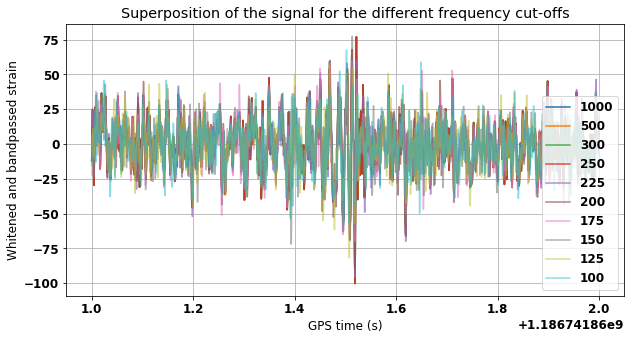

In [39]:
f=plt.figure(figsize=[10,5])
alphas=[1,1,0.8,0.8,0.7,0.7,0.6,0.6,0.5,0.5]
for i in range(len(high_freq)):
    zoom=bsps[i].time_slice(m.time-0.5, m.time+0.5)
    plt.plot(zoom.sample_times, zoom,alpha=alphas[i], label=high_freq[i])
plt.xlabel("GPS time (s)")
plt.ylabel("Whitened and bandpassed strain")
plt.title("Superposition of the signal for the different frequency cut-offs")
plt.legend(loc="best")
plt.grid()

By comparing with the red case, one sees that all the smaller cut offs only lead to a decrease of the amplitude of the signal in the event. It can be seen by zooming even more on the event itself

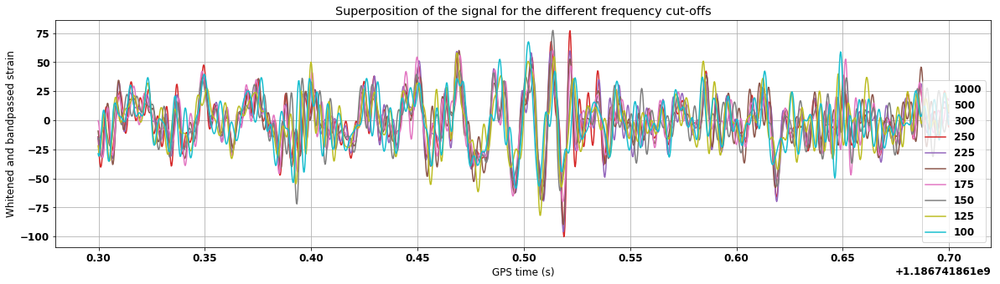

In [40]:
alphas=[0,0,0,1,1,1,1,1,1,1]
f=plt.figure(figsize=(20,5))
for i in range(len(high_freq)):
    zoom=bsps[i].time_slice(m.time-0.2, m.time+0.2)
    plt.plot(zoom.sample_times, zoom, alpha=alphas[i], label=high_freq[i])
plt.xlabel("GPS time (s)")
plt.ylabel("Whitened and bandpassed strain")
plt.title("Superposition of the signal for the different frequency cut-offs")
plt.legend(loc="best")
plt.grid()

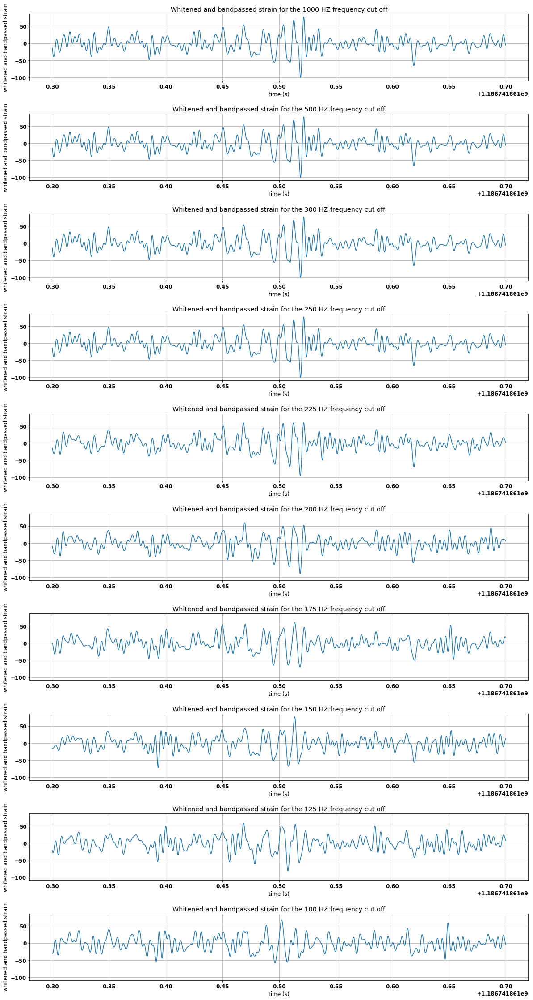

In [41]:
#separated version
f=plt.figure(figsize=[20,15])
ax=f.subplots(nrows=len(high_freq), sharey=True)
f.subplots_adjust(bottom=18, top=20, wspace= 0.4, hspace=0.5)
j=0

for i in range(len(high_freq)):
    zoom=bsps[i].time_slice(m.time-0.2, m.time+0.2)
    ax[j].plot(zoom.sample_times, zoom)
    ax[j].set_xlabel("time (s)")
    ax[j].set_ylabel("whitened and bandpassed strain")
    ax[j].set_title("Whitened and bandpassed strain for the %i HZ frequency cut off" %high_freq[i])
    ax[j].grid()
    j+=1

One sees tha the signal is disapering more and more as the cutoff goes below 250 Hz. For the lowest frequencies, it is event not recognizable anymore.

This could be seen better in a Qtransform of the data

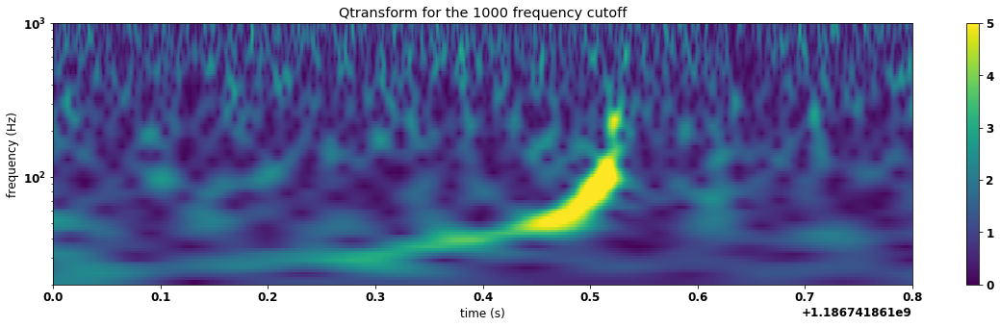

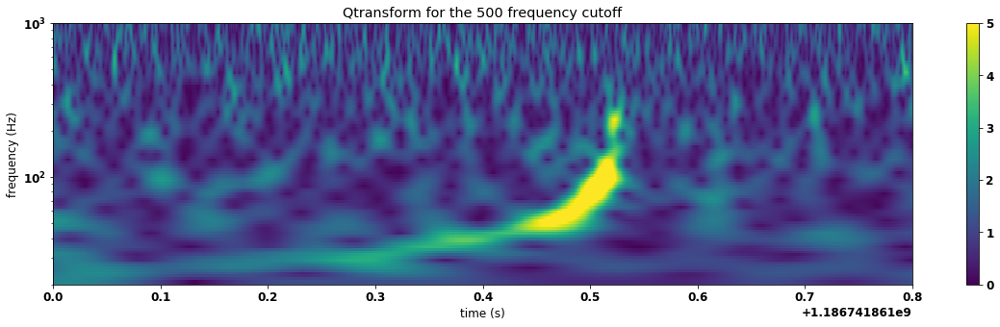

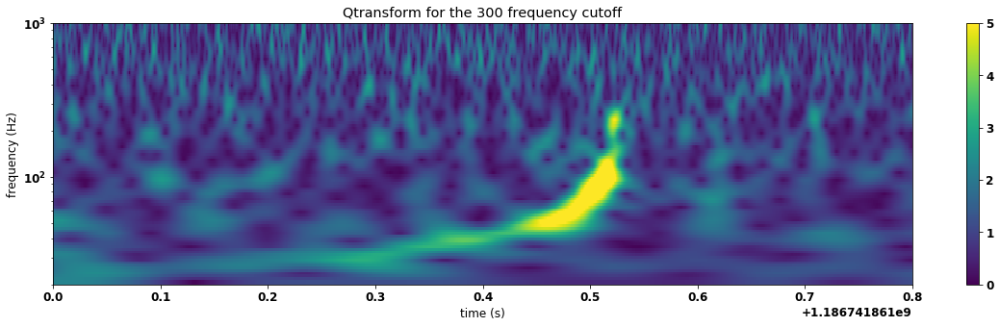

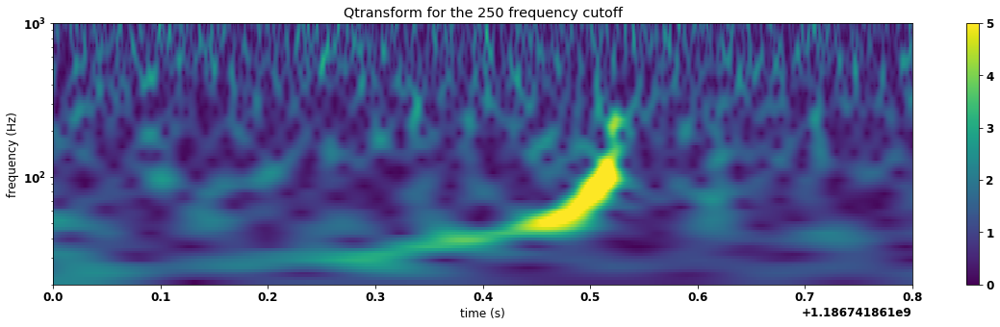

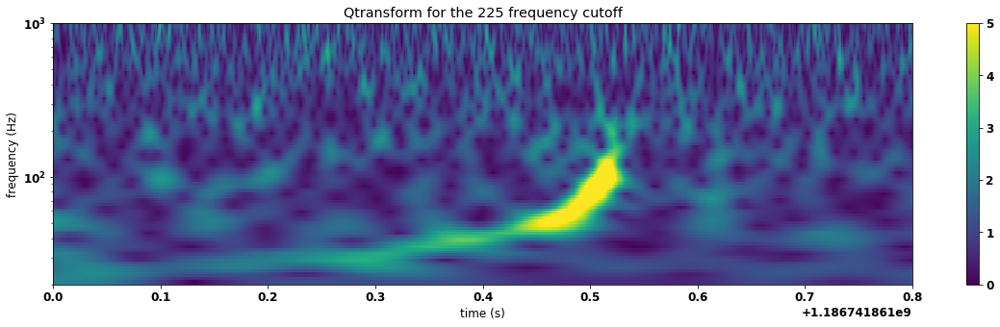

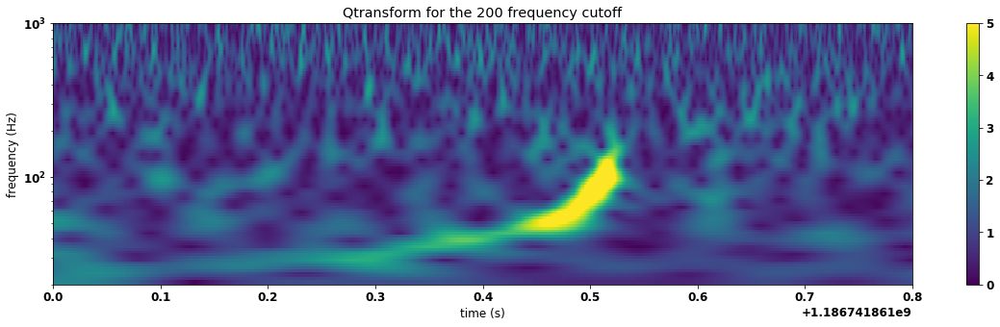

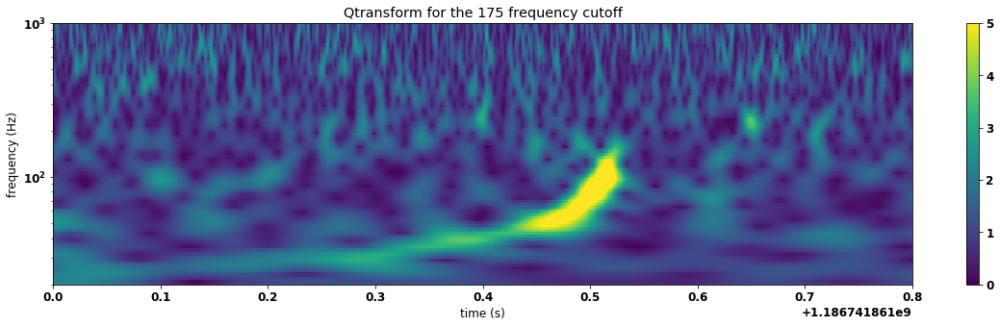

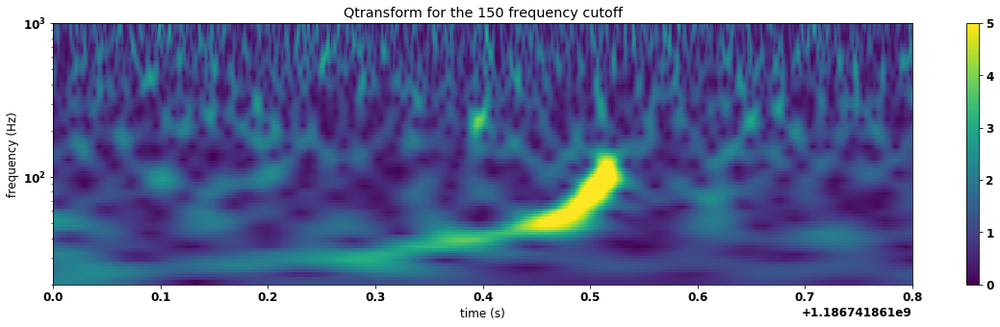

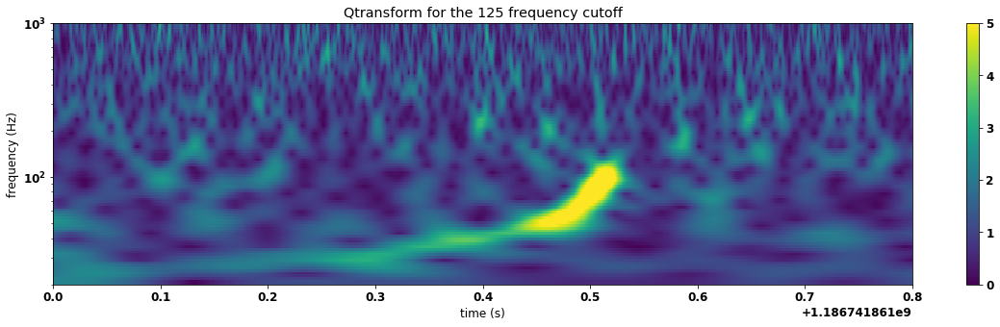

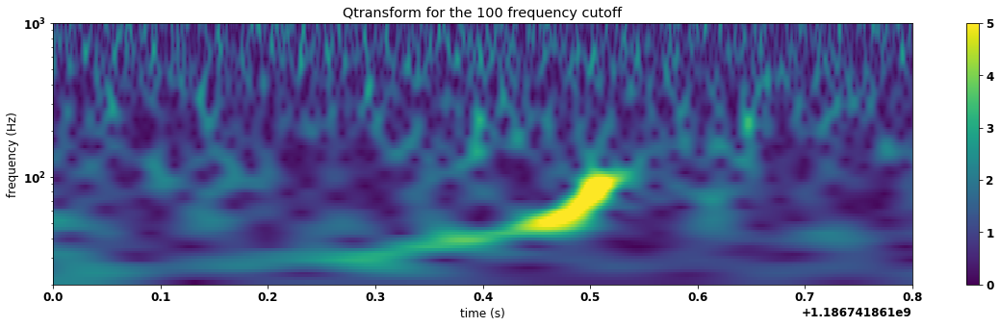

In [42]:
for i in range(len(high_freq)):
    zoom=whitened_passed[i].time_slice(m.time-5, m.time+5)
    times, freqs, power = zoom.qtransform(0.001, logfsteps=100 , qrange=(10,10), frange=(20,1000))
    plt.figure(figsize=(20,5))
    plt.pcolormesh(times, freqs, power**0.5, vmin=0, vmax=5)
    plt.xlim(m.time-0.5, m.time+0.3)
    plt.title("Qtransform for the %i frequency cutoff" %high_freq[i])
    plt.yscale('log')
    plt.xlabel("time (s)")
    plt.ylabel("frequency (Hz)")
    plt.ylim(0,1000)
    plt.colorbar()

When doing the Qtransform for the different cutoff frequencies, we see that the upper part of the signal is cut once we go bollow 250Hz. Indeed, we have first the disapearance of the upper part, followed by the shrinking of the upper part of the banana-lkke shape. This simply shows that, when the cutoff franquency for the low pass is chosen too low, there is a part of the signal that is taken out of the data and can thus not be analyzed any more.

Nevertheless, we can look at the signal to noise ratio for the different cut offs. Indeed, we know that the change is such that there is a apart of the signal missing. However, this part seems to be not too important for 225Hz, as we only take a patch detatched from the principal shape out. After that, we could think that the bana is only shrinked a bit. In fact, this is not true because the scale used is a logarithmic scale, therefore, the shrinking can be more important that what is thought with a quick 'first glance' analysis.

So, hereunder, we look at how the SNR changes when a part of the cut off is changed and even used with a clear part of the signal missing. We use the models  with the parameters that are given in the detection paper. In addition, since there does not seem to be any major difference between the 1000Hz and 500Hz limit for the cutoff frequency, the highest value of both is not used here in the analysis.

The problem encountered in this part is that the inverse spectrum truncation poses problem. When it is used, du to the big drop in the heighest frequencies, the PSD that is found is not the one with the peaks and all but a spectrum where all the PSd is noisy above the frequency cut off. This totally destroys the rest of the prorcedure. Before continuing on this, we look at what happen in a case that is known to work with this method added if we remove that function. Noramlly the difference would not be too big. Indeed, the goal of this function is to coarse-grain/smooth the psd after the convolution of the data with the spectrum is done. Indeed, here are a lot of features in the PSD, which can react with filter and corrupt it, leading to also sharp peaks in it when the convolution is done and would corrupt the total filter. This is thus not done here, conrary to the previous cases, where the peaks are smoothened with the function.

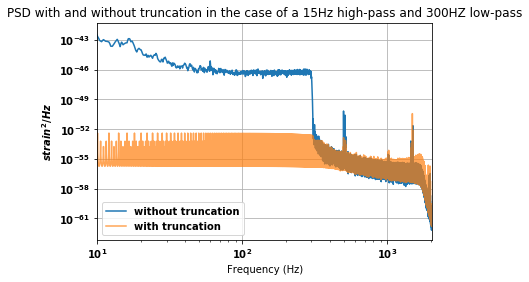

In [43]:
#psd for the case of only 15Hz low pass, one with the inverse spectrum 
#truncation and one without in order to see.
#we also chec the result in the psd computation
%matplotlib inline
from pycbc.catalog import Merger
import matplotlib.pyplot as plt
from pycbc.filter import resample_to_delta_t, highpass
from pycbc.psd import interpolate, inverse_spectrum_truncation
from pycbc.waveform import get_fd_waveform
from pycbc.filter import matched_filter
import numpy

m=Merger("GW170814")
data=m.strain('L1')
datas=[0,0]
psds=[0,0]
snr=[0,0]
peaks=[0,0]
snrp=[0,0]
times=[0,0]
for i in range(2):
    datas[i]=data.highpass_fir(15,512).lowpass_fir(300,512)
    #datas[i]=resample_to_delta_t(datas[i], 1.0/2048)
    datas[i].crop(2,2)
    
    psd=datas[i].psd(3)
    psd=interpolate(psd, datas[i].delta_f)
    if (i == 0):
        psds[i]=psd
        plt.loglog(psd.sample_frequencies, psd, label='without truncation')
    if (i==1):
        psd=inverse_spectrum_truncation(psd, 2*datas[i].sample_rate, low_frequency_cutoff=15.0)
        psds[i]=psd
        plt.loglog(psd.sample_frequencies, psd, alpha=0.7, label='with truncation')
plt.grid()
plt.title("PSD with and without truncation in the case of a 15Hz high-pass and 300HZ low-pass")
plt.xlabel("Frequency (Hz)")
plt.ylabel("$strain^2/Hz$")
plt.xlim(10,2048)
plt.legend(loc="lower left")

The only difference to be seen is the higher value with small rapid variation in the low frequencies. This can be linked to the cutoff frequncy used in order to do the analysis. An other difference is that the peaks are more outstanding in the inverse truncation case for the different lines.

Now we look if this has an influence on the SNR analysis. If there is no main difference between both, then we can do the analysis for the second case by using the non truncated version of the sepctrum. If does not work, then we should conclude that the analysis of the event is not possible in the case where too much of the higher frequencies of the data are cut out of the system

We found a signal at 1186741873.7478027s with a SNR of 236.4339749 Without truncation
We found a signal at 1186741870.3859863s with a SNR of 872500.2054320 With truncation


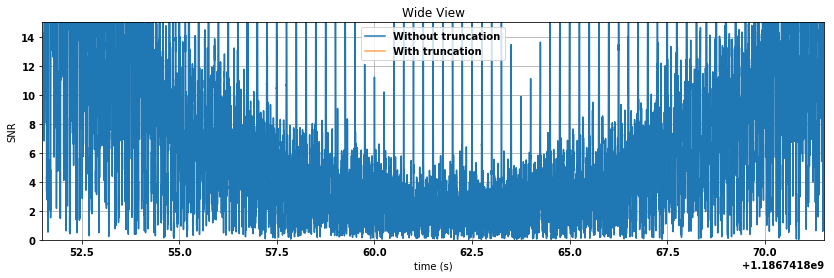

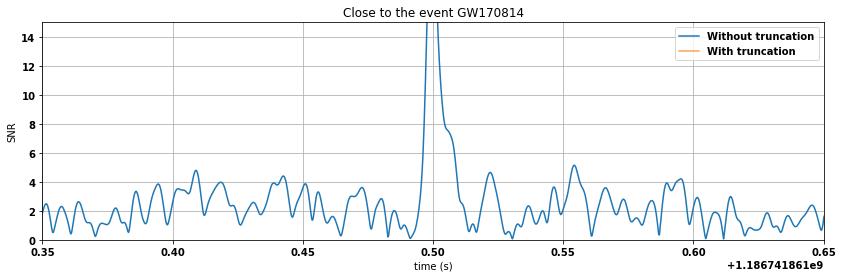

In [44]:
labels=["Without truncation", "With truncation"]
alphas=[1,0.7]
for i in range(2):
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=datas[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, datas[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 
    
for w, title in [(10, 'Wide View'), (.15, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(2):
        plt.plot(snr[i].sample_times, abs(snr[i]), alpha=alphas[i], label=labels[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f %s" %(times[i], abs(snrp[i]), labels[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.ylim(0,15)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We can observe that in the non truncated case, the peak is still well apparent, even if the SNR is still a bit downeighted. So, to not use it is not the best idea in the calssical method. However, in our case, it s not possible to don any analysis if the truncation is used. So, we can drop it for the moment.

In [45]:
#typical data for comparison
m=Merger("GW170814")
data=m.strain("L1")
typ_data=data.highpass_fir(15,512)
typ_data=resample_to_delta_t(typ_data, 1.0/2048)
typ_data.crop(2,2)

typ_psd=typ_data.psd(3)
typ_psd=interpolate(typ_psd, typ_data.delta_f)
typ_psd=inverse_spectrum_truncation(typ_psd, 2*typ_data.sample_rate, low_frequency_cutoff=15.0)

hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=typ_data.delta_f, f_final=739.0645)
hp.resize(len(typ_psd))
template=hp.cyclic_time_shift(hp.start_time)
typ_snr=matched_filter(template, typ_data, psd=typ_psd, low_frequency_cutoff=20)
typ_snr= typ_snr.crop(5, 4) 

We found a signal at 1186741870.3857422s with a SNR of 175.1537101 for the 2000 Hz frequency cutoff
We found a signal at 1186741870.3857422s with a SNR of 84558.2170799 for the 1500 Hz frequency cutoff
We found a signal at 1186741870.3857422s with a SNR of 203956.3282182 for the 1000 Hz frequency cutoff
We found a signal at 1186741870.3857422s with a SNR of 145799.6731585 for the 750 Hz frequency cutoff


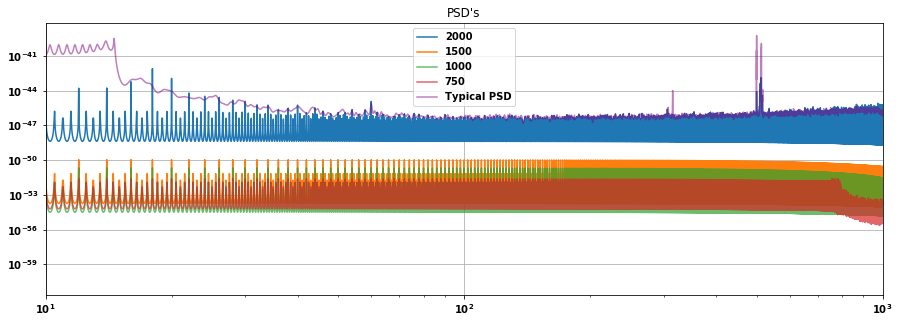

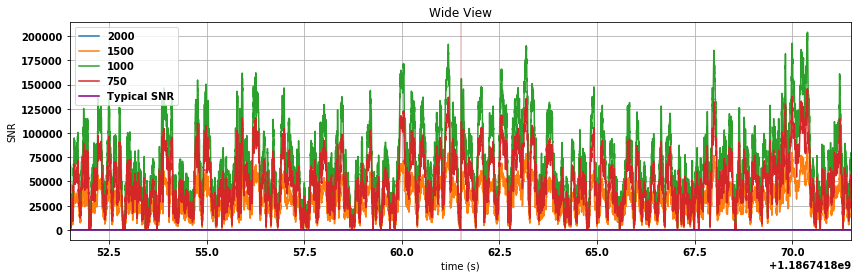

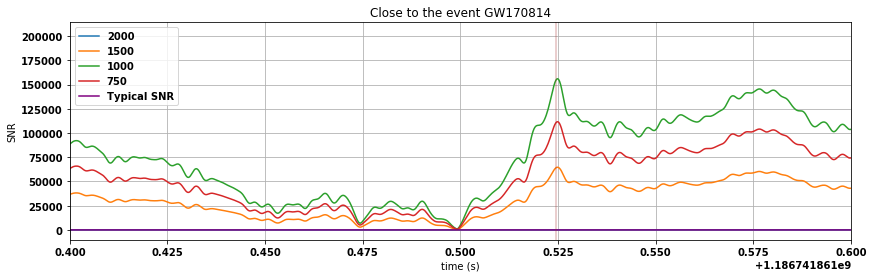

In [46]:
from pycbc.filter import resample_to_delta_t, highpass
from pycbc.psd import interpolate, inverse_spectrum_truncation
from pycbc.waveform import get_fd_waveform
from pycbc.filter import matched_filter
import numpy

alphas=[1, 1, 0.7, 0.7]
m= Merger("GW170814")
data=m.strain('L1')
high_freq=[2000,1500,1000,750]
low_passed=[0 for i in range(len(high_freq))]
psds=[0 for i in range(len(low_passed))]
snr=[0 for i in range(len(low_passed))]
peaks=[0 for i in range(len(low_passed))]
snrp=[0 for i in range(len(low_passed))]
times=[0 for i in range(len(low_passed))]

plt.figure(figsize=(15,5))
for i in range(len(high_freq)):
    #data conditioning
    low_passed[i]=data.highpass_fir(15, 512).lowpass_fir(high_freq[i],512)
    #low_passed[i]=resample_to_delta_t(low_passed[i], 1.0/2048)
    low_passed[i].crop(2,2)
    #psd calculation
    psd=low_passed[i].psd(3)
    psd=interpolate(psd, low_passed[i].delta_f)
    psd=inverse_spectrum_truncation(psd, 2*low_passed[i].sample_rate, low_frequency_cutoff=15.0)
    plt.loglog(psd.sample_frequencies, psd, alpha=alphas[i], label=high_freq[i])
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=low_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, low_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4)
plt.loglog(typ_psd.sample_frequencies, typ_psd, alpha=0.5, label="Typical PSD", color='Purple')
plt.legend()
plt.title("PSD's")
plt.grid()
plt.xlim(10,1000)
for w, title in [(10, 'Wide View'), (.1, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(high_freq)):
        plt.plot(snr[i].sample_times, abs(snr[i]), label=high_freq[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), high_freq[i]))
    plt.plot(typ_snr.sample_times, abs(typ_snr), label="Typical SNR", color='Purple')
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.axvline(1186741861.5244141, color='Brown', alpha=0.3)
    #plt.ylim(0,20)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We found a signal at 1186741861.5244141s with a SNR of 12.7025935 for the 2000 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7027265 for the 1500 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7027454 for the 1000 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7027359 for the 750 Hz frequency cutoff


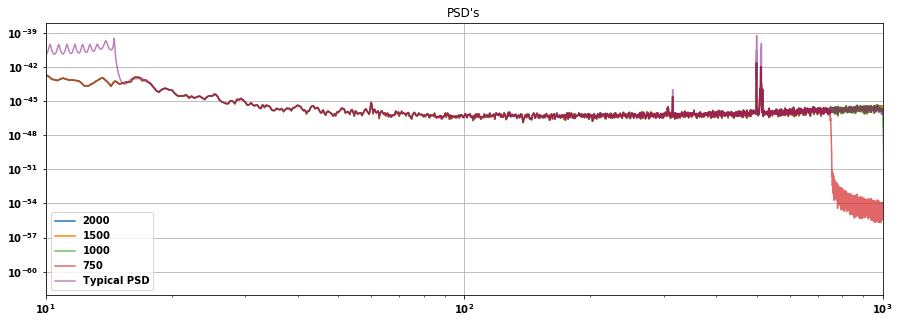

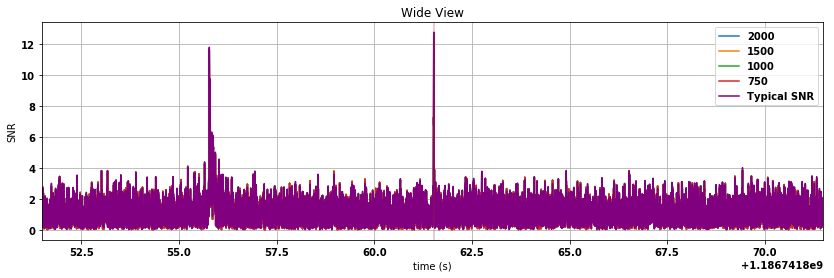

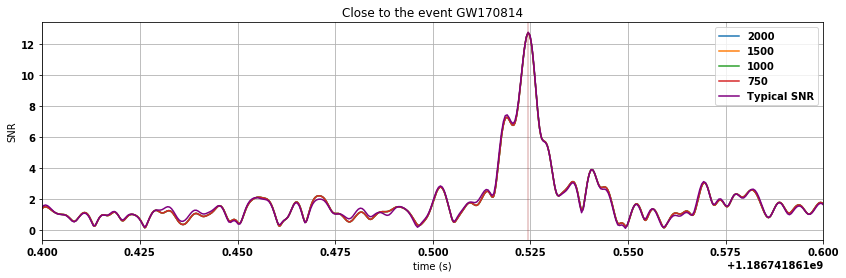

In [47]:
#now without the inverse spectrum truncation
alphas=[1, 1, 0.7, 0.7]
m= Merger("GW170814")
data=m.strain('L1')
high_freq=[2000,1500,1000,750]
low_passed=[0 for i in range(len(high_freq))]
psds=[0 for i in range(len(low_passed))]
snr=[0 for i in range(len(low_passed))]
peaks=[0 for i in range(len(low_passed))]
snrp=[0 for i in range(len(low_passed))]
times=[0 for i in range(len(low_passed))]

plt.figure(figsize=(15,5))
for i in range(len(high_freq)):
    #data conditioning
    low_passed[i]=data.highpass_fir(15, 512).lowpass_fir(high_freq[i],512)
    #low_passed[i]=resample_to_delta_t(low_passed[i], 1.0/2048)
    low_passed[i].crop(2,2)
    #psd calculation
    psd=low_passed[i].psd(3)
    psd=interpolate(psd, low_passed[i].delta_f)
    #psd=inverse_spectrum_truncation(psd, 2*low_passed[i].sample_rate, low_frequency_cutoff=15.0)
    plt.loglog(psd.sample_frequencies, psd, alpha=alphas[i], label=high_freq[i])
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=low_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, low_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4)
plt.loglog(typ_psd.sample_frequencies, typ_psd, alpha=0.5, label="Typical PSD", color='Purple')
plt.legend()
plt.title("PSD's")
plt.grid()
plt.xlim(10,1000)
for w, title in [(10, 'Wide View'), (.1, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(high_freq)):
        plt.plot(snr[i].sample_times, abs(snr[i]), label=high_freq[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), high_freq[i]))
    plt.plot(typ_snr.sample_times, abs(typ_snr), label="Typical SNR", color='Purple')
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.axvline(1186741861.5244141, color='Brown', alpha=0.3)
    #plt.ylim(0,20)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We found a signal at 1186741861.5244141s with a SNR of 12.7037139 for the 2000 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7035324 for the 1500 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7035535 for the 1000 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7034096 for the 950 Hz frequency cutoff


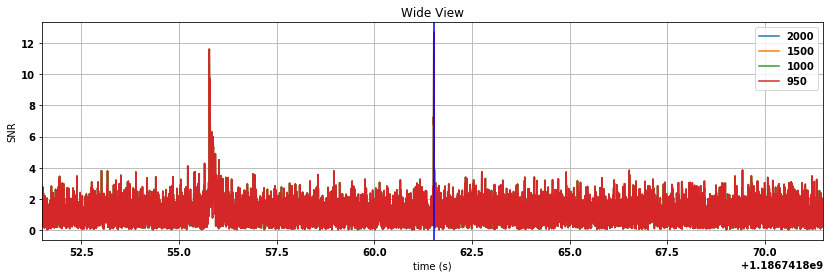

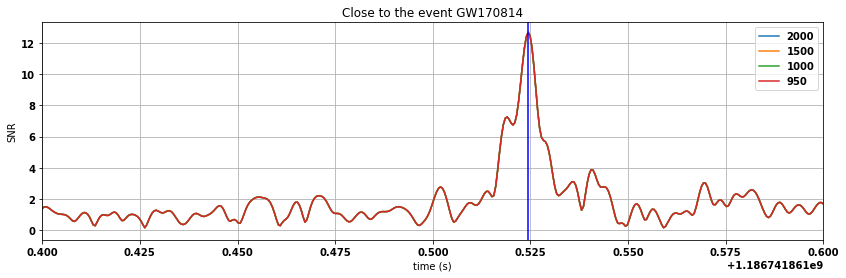

In [48]:
#without 750Hz in order to have a better focus on the lower region
high_freq=[2000,1500,1000,950]
low_passed=[0 for i in range(len(high_freq))]
psds=[0 for i in range(len(low_passed))]
snr=[0 for i in range(len(low_passed))]
peaks=[0 for i in range(len(low_passed))]
snrp=[0 for i in range(len(low_passed))]
times=[0 for i in range(len(low_passed))]

for i in range(len(high_freq)):
    #data conditioning
    low_passed[i]=data.highpass_fir(15, 512).lowpass_fir(high_freq[i],512)
    low_passed[i]=resample_to_delta_t(low_passed[i], 1.0/2048)
    low_passed[i].crop(2,2)
    #psd calculation
    psd=low_passed[i].psd(3)
    psd=interpolate(psd, low_passed[i].delta_f)
    #psd=inverse_spectrum_truncation(psd, 2*low_passed[i].sample_rate, low_frequency_cutoff=15.0)
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=low_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, low_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 

for w, title in [(10, 'Wide View'), (.1, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(high_freq)):
        plt.plot(snr[i].sample_times, abs(snr[i]), label=high_freq[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), high_freq[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.axvline(1186741861.5244141, color='blue')
    #plt.ylim(0,20)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We found a signal at 1186741861.5244141s with a SNR of 12.7037139 for the 2000 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7034096 for the 950 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7031647 for the 750 Hz frequency cutoff
We found a signal at 1186741873.7431641s with a SNR of 83.1400531 for the 600 Hz frequency cutoff
We found a signal at 1186741873.7446289s with a SNR of 798.6526612 for the 500 Hz frequency cutoff


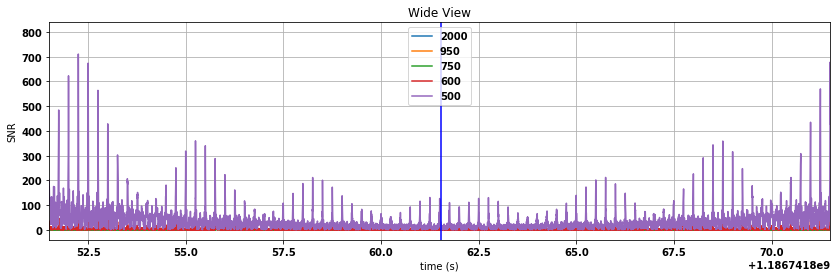

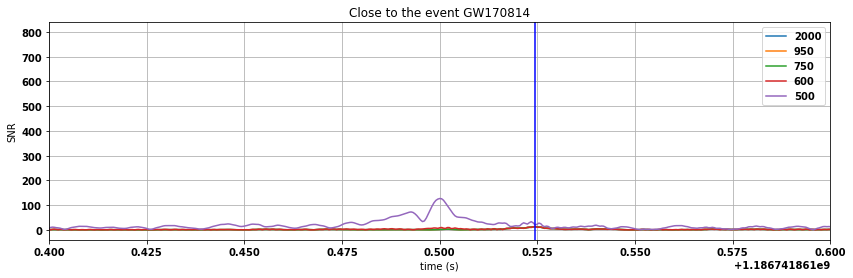

In [49]:
#even smaller cutoff than 750Hz
high_freq=[2000,950, 750, 600,500]
low_passed=[0 for i in range(len(high_freq))]
psds=[0 for i in range(len(low_passed))]
snr=[0 for i in range(len(low_passed))]
peaks=[0 for i in range(len(low_passed))]
snrp=[0 for i in range(len(low_passed))]
times=[0 for i in range(len(low_passed))]

for i in range(len(high_freq)):
    #data conditioning
    low_passed[i]=data.highpass_fir(15, 512).lowpass_fir(high_freq[i],512)
    low_passed[i]=resample_to_delta_t(low_passed[i], 1.0/2048)
    low_passed[i].crop(2,2)
    #psd calculation
    psd=low_passed[i].psd(3)
    psd=interpolate(psd, low_passed[i].delta_f)
    #psd=inverse_spectrum_truncation(psd, 2*low_passed[i].sample_rate, low_frequency_cutoff=15.0)
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=low_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, low_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 

for w, title in [(10, 'Wide View'), (.1, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(high_freq)):
        plt.plot(snr[i].sample_times, abs(snr[i]), label=high_freq[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), high_freq[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.axvline(1186741861.5244141, color='blue')
    #plt.ylim(0,20)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We found a signal at 1186741861.5244141s with a SNR of 12.7037139 for the 2000 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7034096 for the 950 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.7031647 for the 750 Hz frequency cutoff
We found a signal at 1186741873.7431641s with a SNR of 83.1400531 for the 600 Hz frequency cutoff


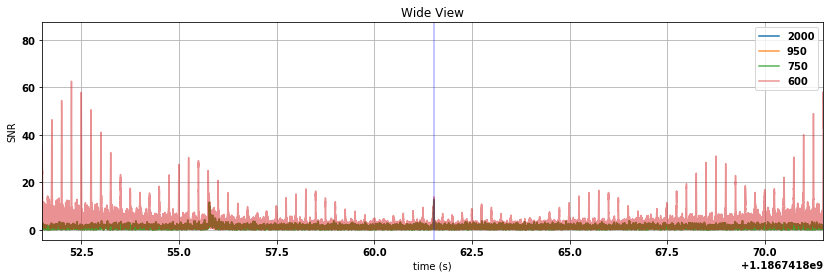

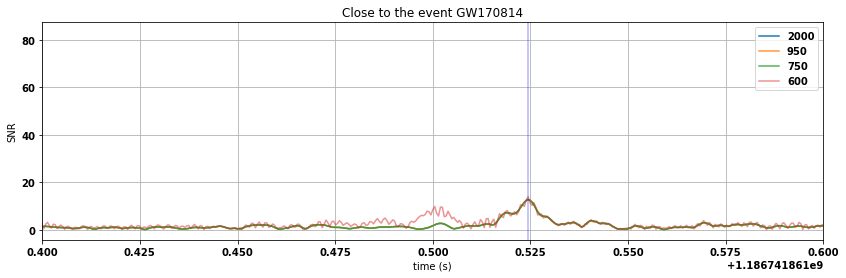

In [50]:
#even smaller cutoff than 750Hz
alphas=[1,0.8,0.8,0.5]
high_freq=[2000,950, 750, 600]
low_passed=[0 for i in range(len(high_freq))]
psds=[0 for i in range(len(low_passed))]
snr=[0 for i in range(len(low_passed))]
peaks=[0 for i in range(len(low_passed))]
snrp=[0 for i in range(len(low_passed))]
times=[0 for i in range(len(low_passed))]

for i in range(len(high_freq)):
    #data conditioning
    low_passed[i]=data.highpass_fir(15, 512).lowpass_fir(high_freq[i],512)
    low_passed[i]=resample_to_delta_t(low_passed[i], 1.0/2048)
    low_passed[i].crop(2,2)
    #psd calculation
    psd=low_passed[i].psd(3)
    psd=interpolate(psd, low_passed[i].delta_f)
    #psd=inverse_spectrum_truncation(psd, 2*low_passed[i].sample_rate, low_frequency_cutoff=15.0)
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=low_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, low_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 

for w, title in [(10, 'Wide View'), (.1, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(high_freq)):
        plt.plot(snr[i].sample_times, abs(snr[i]), alpha=alphas[i], label=high_freq[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), high_freq[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.axvline(1186741861.5244141, color='blue', alpha=0.3)
    #plt.ylim(0,20)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

When removing the high freuencies, there is somthing happeining to the PSD which leads to a change in behaviour. This is made stronger by the use of the inverse truncation function which should normally smooth the data

We have the apparition of the structure for the cut-off of 600Hz. So, we do the analysis for that case butwith different beta paramters in highpass case

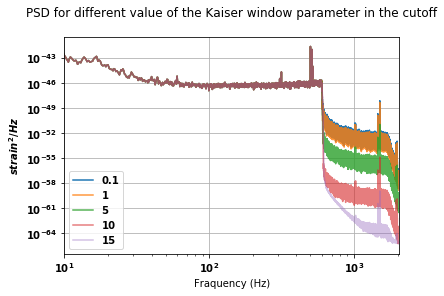

In [51]:
betas=[0.1, 1, 5, 10, 15]
alphas = [1,0.8,0.8,0.6,0.4,0.2]
m= Merger("GW170814")
data=m.strain('L1')

filtered = []
psds = []

for i in range(len(betas)):
    fil = data.highpass_fir(15,512).lowpass_fir(600, 512, beta = betas[i])
    fil = fil.crop(2,2)
    
    filtered.append(fil)
    
    psd = fil.psd(3)
    psd=interpolate(psd, fil.delta_f)
    psds.append(psd)

for i in range(len(psds)):
    plt.loglog(psds[i].sample_frequencies, psds[i], alpha = alphas[i], label = betas[i])
plt.grid()
plt.xlabel("Fraquency (Hz)")
plt.ylabel("$strain^2/Hz$")
plt.title("PSD for different value of the Kaiser window parameter in the cutoff", pad = 20) 
plt.xlim(10,2048)
plt.legend()

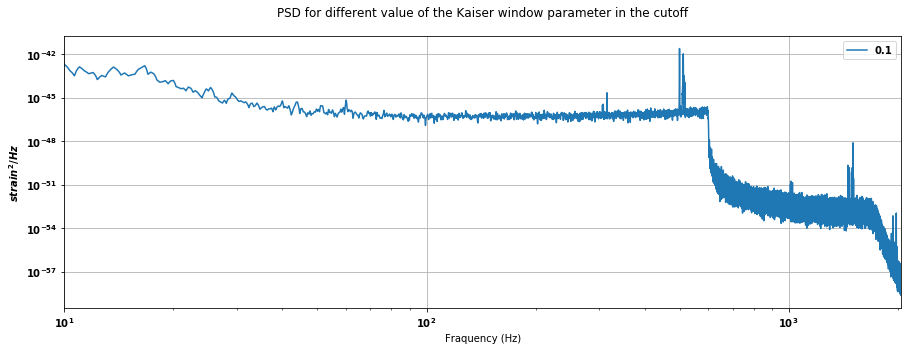

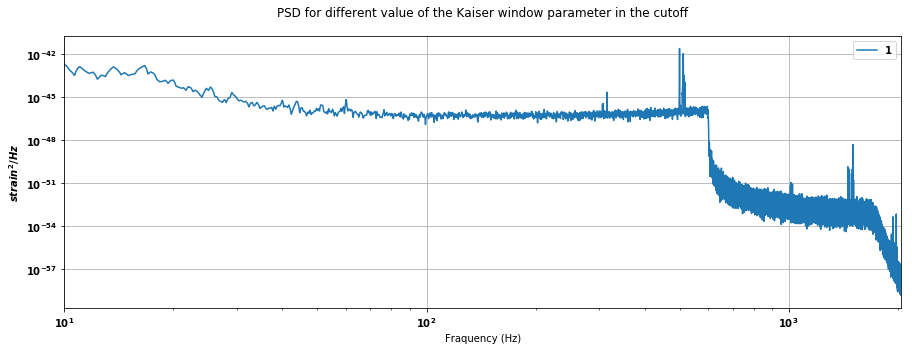

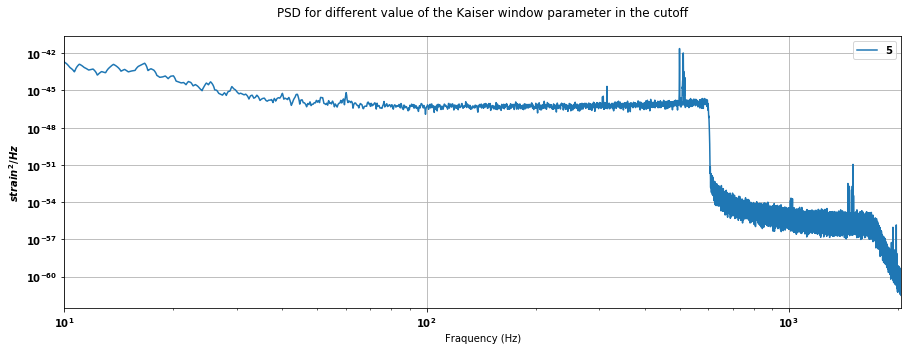

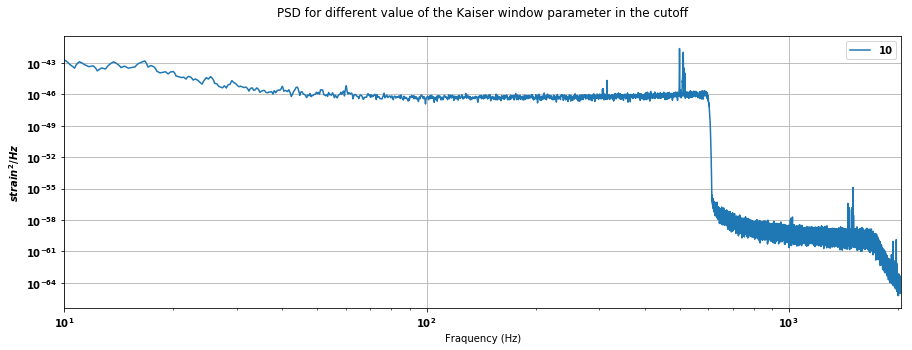

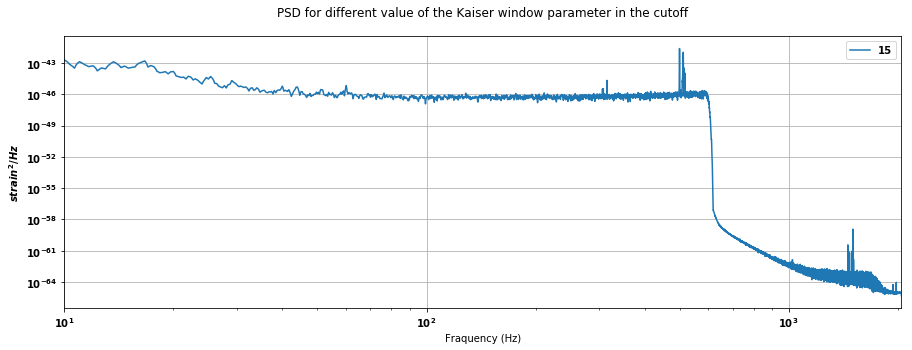

In [52]:
for i in range(len(psds)):
    plt.figure(figsize=[15,5])
    plt.loglog(psds[i].sample_frequencies, psds[i], label = betas[i])
    plt.grid()
    plt.xlabel("Fraquency (Hz)")
    plt.ylabel("$strain^2/Hz$")
    plt.title("PSD for different value of the Kaiser window parameter in the cutoff", pad = 20) 
    plt.xlim(10,2048)
    plt.legend()

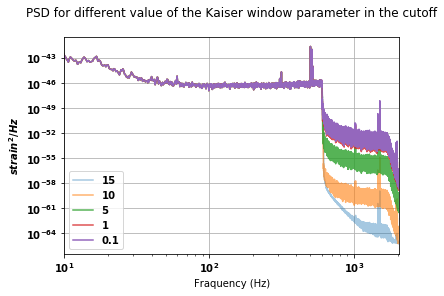

In [53]:
i=len(psds)-1
while i > (-1):
    plt.loglog(psds[i].sample_frequencies, psds[i], alpha = alphas[i], label = betas[i])
    i = i-1
    
plt.grid()
plt.xlabel("Fraquency (Hz)")
plt.ylabel("$strain^2/Hz$")
plt.title("PSD for different value of the Kaiser window parameter in the cutoff", pad = 20) 
plt.xlim(10,2048)
plt.legend()

Here, we do not see any difference in the PSD. May be it too subtil to be seen like that. 

We found a signal at 1186741861.5244141s with a SNR of 12.7080711 for the 600 Hz frequency cutoff and a value 0.100 for beta
We found a signal at 1186741861.5244141s with a SNR of 12.7083216 for the 600 Hz frequency cutoff and a value 1.000 for beta
We found a signal at 1186741873.7431641s with a SNR of 83.1400531 for the 600 Hz frequency cutoff and a value 5.000 for beta
We found a signal at 1186741873.7348633s with a SNR of 29790.5177723 for the 600 Hz frequency cutoff and a value 10.000 for beta
We found a signal at 1186741873.4726562s with a SNR of 11285.2391437 for the 600 Hz frequency cutoff and a value 15.000 for beta


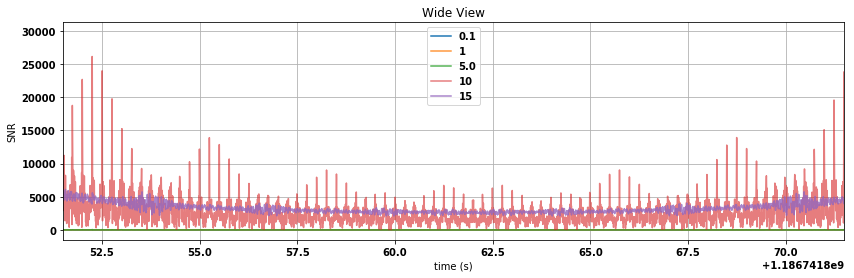

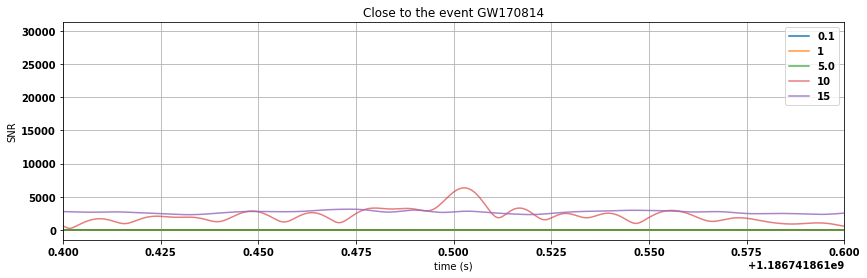

In [54]:
betas=[0.1, 1, 5., 10, 15]
alphas = [1,0.8,0.8,0.6,0.8]
low_passed=[0 for i in range(len(betas))]
psds=[0 for i in range(len(betas))]
snr=[0 for i in range(len(betas))]
peaks=[0 for i in range(len(low_passed))]
snrp=[0 for i in range(len(low_passed))]
times=[0 for i in range(len(low_passed))]

for i in range(len(betas)):
    #data conditioning
    low_passed[i]=data.highpass_fir(15, 512).lowpass_fir(600, 512, beta = betas[i])
    low_passed[i]=resample_to_delta_t(low_passed[i], 1.0/2048)
    low_passed[i].crop(2,2)
    #psd calculation
    psd=low_passed[i].psd(3)
    psd=interpolate(psd, low_passed[i].delta_f)
    #psd=inverse_spectrum_truncation(psd, 2*low_passed[i].sample_rate, low_frequency_cutoff=15.0)
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=low_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, low_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 

for w, title in [(10, 'Wide View'), (.1, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(betas)):
        plt.plot(snr[i].sample_times, abs(snr[i]), alpha=alphas[i], label=betas[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the 600 Hz frequency cutoff and a value %.3f for beta" %(times[i], abs(snrp[i]), betas[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    #plt.axvline(1186741861.5244141, color='blue', alpha=0.3)
    #plt.ylim(0,20)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We can look at what happens if we continuer to decrease the value of the cut-off frequency with the value of beta set at one everywhere.

First, we look at the event when the value of beta = 1

We found a signal at 1186741861.5244141s with a SNR of 12.7083216 for the 600 Hz frequency cutoff and a value 1.000 for beta


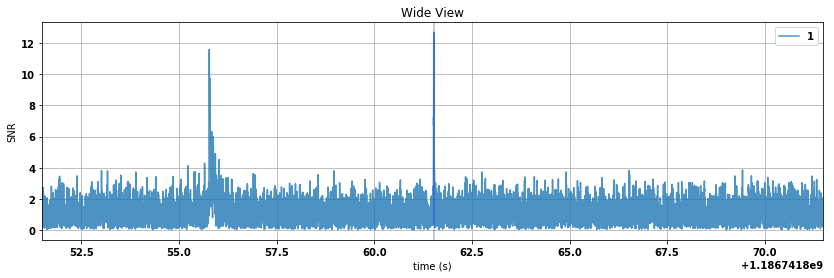

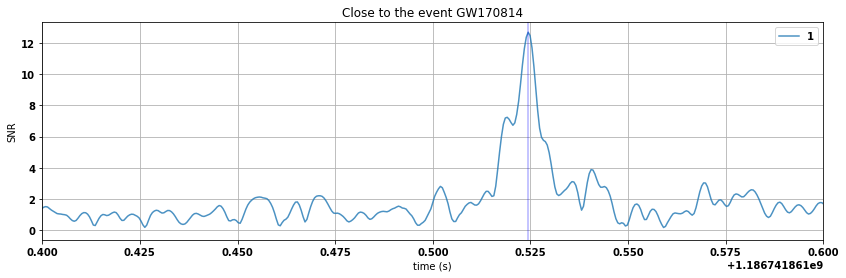

In [55]:
i = 1

for w, title in [(10, 'Wide View'), (.1, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    plt.plot(snr[i].sample_times, abs(snr[i]), alpha=alphas[i], label=betas[i])
    if(w==10):
        peaks[i]=abs(snr[i]).numpy().argmax()
        snrp[i]=snr[i][peaks[i]]
        times[i]=snr[i].sample_times[peaks[i]]
        print("We found a signal at %.7fs with a SNR of %.7f for the 600 Hz frequency cutoff and a value %.3f for beta" %(times[i], abs(snrp[i]), betas[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.axvline(1186741861.5244141, color='blue', alpha=0.3)
    #plt.ylim(0,20)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

We see tha the signal is perfrectly refound in this case.

Now we test what is happening if we set the value of beta at one and go even lower than 600Hz for the cut-off

We found a signal at 1186741861.5244141s with a SNR of 12.6433990 for the 500 Hz frequency cutoff
We found a signal at 1186741861.5244141s with a SNR of 12.2292067 for the 450 Hz frequency cutoff
We found a signal at 1186741861.5239258s with a SNR of 9.8251708 for the 400 Hz frequency cutoff
We found a signal at 1186741873.7490234s with a SNR of 7.7769376 for the 300 Hz frequency cutoff


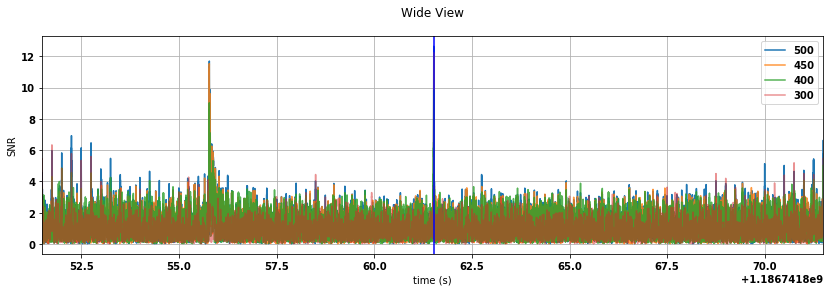

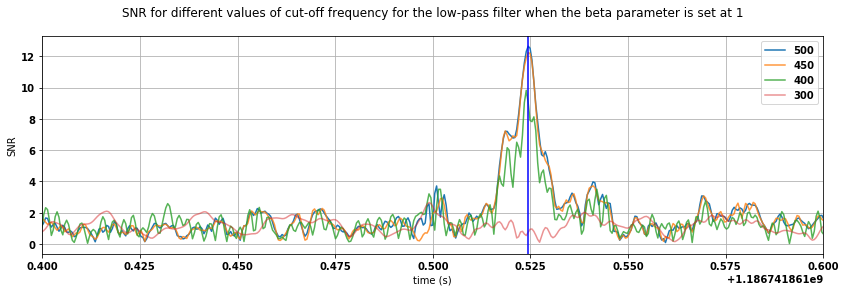

In [98]:
alphas=[1,0.8,0.8,0.5]
high_freq=[500, 450, 400, 300]
low_passed=[0 for i in range(len(high_freq))]
psds=[0 for i in range(len(low_passed))]
snr=[0 for i in range(len(low_passed))]
peaks=[0 for i in range(len(low_passed))]
snrp=[0 for i in range(len(low_passed))]
times=[0 for i in range(len(low_passed))]

for i in range(len(high_freq)):
    #data conditioning
    low_passed[i]=data.highpass_fir(15, 512).lowpass_fir(high_freq[i],512, beta = 1.0)
    low_passed[i]=resample_to_delta_t(low_passed[i], 1.0/2048)
    low_passed[i].crop(2,2)
    #psd calculation
    psd=low_passed[i].psd(3)
    psd=interpolate(psd, low_passed[i].delta_f)
    #psd=inverse_spectrum_truncation(psd, 2*low_passed[i].sample_rate, low_frequency_cutoff=15.0)
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=low_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, low_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 

for w, title in [(10, 'Wide View'), (.1, 'SNR for different values of cut-off frequency for the low-pass filter when the beta parameter is set at 1')]:
    plt.figure(figsize=(14,4))
    for i in range(len(high_freq)):
        plt.plot(snr[i].sample_times, abs(snr[i]), alpha=alphas[i], label=high_freq[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the %i Hz frequency cutoff" %(times[i], abs(snrp[i]), high_freq[i]))
    plt.legend(loc='best')
    plt.title(title, pad = 20)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    plt.axvline(1186741861.5244141, color='blue', alpha=1)
    #plt.ylim(0,20)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")

Now, we see that the SNR of the signal decreases for low cutoffs before being zero at the below 400Hz

### Plotting of the Kaiser window 

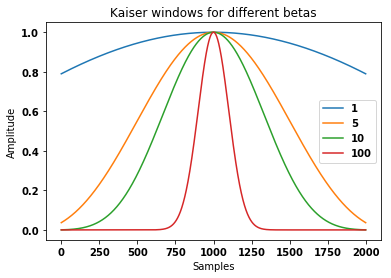

In [72]:
import numpy as np
from numpy.fft import fft, fftshift

betas = [1, 5, 10, 100]

kaisers = []

for i in range(len(betas)):
    kai = np.kaiser(2000, betas[i])
    kaisers.append(kai)
    plt.plot(kai, label = betas[i])
plt.title("Kaiser windows for different betas")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.legend(loc='best')

/home/justin/.local/lib/python2.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  


Text(0.5,1,'Kaiser window in the frequency domain')

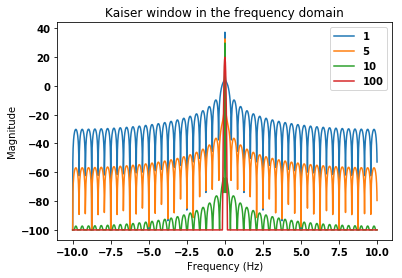

In [77]:
#frequency response of the window
freqs = []
resps = []
for i in range(len(betas)):
    A = fft(kaisers[i], 2048) /25.5
    mag = np.abs(fftshift(A))
    freq = np.linspace(-10, 10, len(A))
    resp = 20*np.log10(mag)
    resp = np.clip(resp, -100, 100)
    resps.append(resp)
    freqs.append(freq)
    plt.plot(freq, resp, label = betas[i])
plt.legend(loc='best')
plt.ylabel('Magnitude')
plt.xlabel("Frequency (Hz)")
plt.title("Kaiser window in the frequency domain")

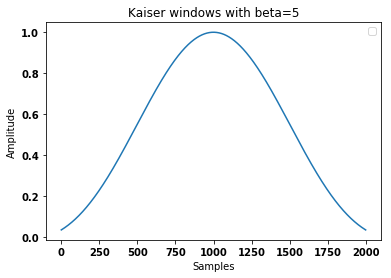

In [84]:
#for one Kaiser window, could be easier to make
plt.plot(kaisers[1])
plt.title("Kaiser windows with beta=5")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.legend(loc='best')

Text(0.5,1,'Kaiser window in the frequency domain for beta = 5')

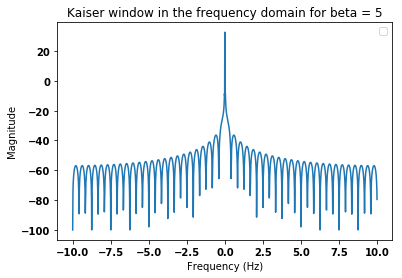

In [85]:
plt.plot(freqs[1], resps[1])
plt.legend(loc='best')
plt.ylabel('Magnitude')
plt.xlabel("Frequency (Hz)")
plt.title("Kaiser window in the frequency domain for beta = 5")

We found a signal at 1186741861.5244141s with a SNR of 12.7080711 for the 600 Hz frequency cutoff and a value 0.100 for beta
We found a signal at 1186741861.5244141s with a SNR of 12.7083216 for the 600 Hz frequency cutoff and a value 1.000 for beta
We found a signal at 1186741873.7431641s with a SNR of 83.1400531 for the 600 Hz frequency cutoff and a value 5.000 for beta


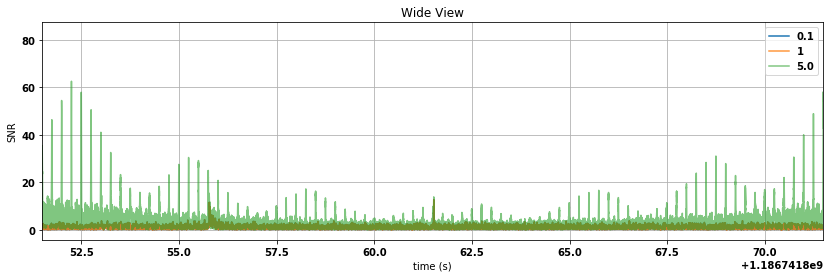

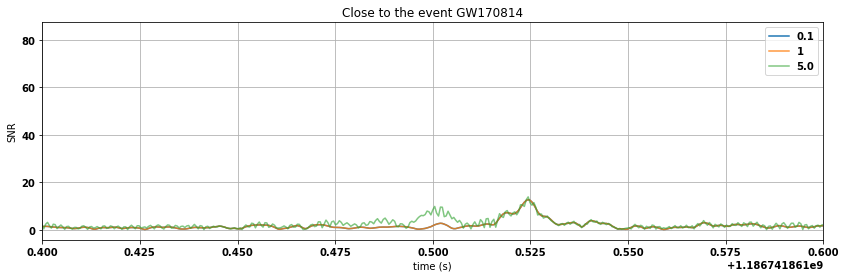

In [94]:
betas=[0.1, 1, 5.]
alphas = [1,0.8,0.6,0.6,0.8]
low_passed=[0 for i in range(len(betas))]
psds=[0 for i in range(len(betas))]
snr=[0 for i in range(len(betas))]
peaks=[0 for i in range(len(low_passed))]
snrp=[0 for i in range(len(low_passed))]
times=[0 for i in range(len(low_passed))]

for i in range(len(betas)):
    #data conditioning
    low_passed[i]=data.highpass_fir(15, 512).lowpass_fir(600, 512, beta = betas[i])
    low_passed[i]=resample_to_delta_t(low_passed[i], 1.0/2048)
    low_passed[i].crop(2,2)
    #psd calculation
    psd=low_passed[i].psd(3)
    psd=interpolate(psd, low_passed[i].delta_f)
    #psd=inverse_spectrum_truncation(psd, 2*low_passed[i].sample_rate, low_frequency_cutoff=15.0)
    psds[i]=psd
    hp, hf = get_fd_waveform(approximant="IMRPhenomD",
                         mass1=30.5, mass2=25.3, spin1z=-0.56879753, spin2z=0.13079314, distance=540, inclination=0.6,
                         f_lower=20.0, delta_f=low_passed[i].delta_f, f_final=739.0645)
    hp.resize(len(psds[i]))
    template=hp.cyclic_time_shift(hp.start_time)
    snr[i]=matched_filter(template, low_passed[i], psd=psds[i], low_frequency_cutoff=20)
    snr[i] = snr[i].crop(5, 4) 

for w, title in [(10, 'Wide View'), (.1, 'Close to the event GW170814')]:
    plt.figure(figsize=(14,4))
    for i in range(len(betas)):
        plt.plot(snr[i].sample_times, abs(snr[i]), alpha=alphas[i], label=betas[i])
        if(w==10):
            peaks[i]=abs(snr[i]).numpy().argmax()
            snrp[i]=snr[i][peaks[i]]
            times[i]=snr[i].sample_times[peaks[i]]
            print("We found a signal at %.7fs with a SNR of %.7f for the 600 Hz frequency cutoff and a value %.3f for beta" %(times[i], abs(snrp[i]), betas[i]))
    plt.legend(loc='best')
    plt.title(title)
    plt.grid()
    plt.xlim(m.time-w, m.time+w)
    #plt.axvline(1186741861.5244141, color='blue', alpha=0.3)
    #plt.ylim(0,20)
    plt.xlabel("time (s)")
    plt.ylabel("SNR")